In [1]:
import sys
import os
sys.path.append("../src/")
import combat
import numpy as np
import scipy.stats as stats
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
import sklearn
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sb
import pickle as pkl
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, ElasticNet
import random as rd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 500
from sklearn.preprocessing import quantile_transform,binarize
from sklearn.model_selection import LeaveOneOut,KFold
from sklearn.metrics import r2_score
from statsmodels.stats.multitest import multipletests
from sklearn.cross_decomposition import PLSRegression as PLS
import warnings
warnings.simplefilter("ignore")
from multiprocessing import Process,Queue,Pool
import time 
import helper
from multiprocessing import set_start_method
#set_start_method("spawn")
from DecoID.DecoID import flatten
from sklearn.cross_decomposition import PLSRegression
from sklearn.svm import SVC
import importlib
import helper#import the module here, so that it can be reloaded.
importlib.reload(helper)
rd.seed(3256)

In [2]:
#load in metadata and peak areas and associate

#read in peak data
datafilename = "../data/QTof-B1-9_pHILIC_HSS_pos-neg_normalized.csv"

data = pd.read_csv(datafilename)

#get area columns
areaCols = data.columns.values[10:]

#get molecule names
mol_names = data["Compound Name"].values

#extract area data and transpose
areaData = data[areaCols].transpose()

#get batch information
batchInfo = [int(x.split("_")[0][1]) for x in list(areaData.index.values)]

areaData = areaData.to_numpy()
areaData = areaData.astype(np.float)

#get index of blanks
blankSamp = [x for x in range(len(areaCols)) if "Blank" in areaCols[x] and not "equil" in areaCols[x]]
print(len(blankSamp)," blanks")

#get index of qc
qcSamp = [x for x in range(len(areaCols)) if "NIST" in areaCols[x] and not "equil" in areaCols[x] ]
print(len(qcSamp)," qc samples")

#get index of wu350 samples
samp = [x for x in range(len(areaCols)) if "WU350" in areaCols[x] and not "equil" in areaCols[x]]
print(len(samp), "research samples")

#load in metadata
metadatafn = "../data/Experiment-Parameters_b1-9.csv"
metadata = pd.read_csv(metadatafn)

#extact sample names for d0_yes samples
metadata_rel = metadata[metadata["day-COVID"] == "d0_Yes"]
print(len(metadata_rel)," d0 Covid+ Samples")

metadata_val = metadata[metadata["day-COVID"] == "d0_No"]
print(len(metadata_val), "d0 Covid- Samples")

val_samples = []
for index,row in metadata_val.iterrows():
    val_samples.append(row["Sample General Name"])
    
val_cols = []
for val_s in val_samples:
    for col in range(len(areaCols)):
        if areaCols[col] == val_s:
            val_cols.append(col)
            break

            
#create sample name, ventilator status linkage
vent_dict = {}
metadata_dict = {}
for index,row in metadata_rel.iterrows():
    val = str(row["ICU"])
    sampName = row["Sample General Name"]
    if "es" in val:
        val = 1
    elif "o" in val:
        val = 0
    vent_dict[sampName] = val
    metadata_dict[sampName] = row

print(np.sum(list(vent_dict.values()))," ICU+ samples")
print(len(vent_dict) - np.sum(list(vent_dict.values())),"ICU- samples")

#link vent status to sample in peak data
vent_status = []
metadata_for_samples = []
for s in np.array(areaCols)[samp]:
    tmp = s
    if tmp in vent_dict:
        vent_status.append(vent_dict[tmp])
        metadata_for_samples.append(metadata_dict[tmp])
    else:
        vent_status.append(-1)
        metadata_for_samples.append(-1)
print("found vent info for",len([x for x in vent_status if x != -1]),"covid_ d0 samples")
samplesOfInterest = [x for x in range(len(vent_status)) if vent_status[x] != -1]

val_int = areaData[val_cols]
val_batch = np.array(batchInfo)[val_cols]
val_vent = np.array([0 for _ in val_batch])

#create sample matrix
samp_batch = np.array(batchInfo)[samp][samplesOfInterest]
samp_int = areaData[samp][samplesOfInterest]
samp_vent = np.array(vent_status)[samplesOfInterest]
samp_metadata = [metadata_for_samples[x] for x in samplesOfInterest]

#create blank matrix
blank_batch = np.array(batchInfo)[blankSamp]
blank_int = areaData[blankSamp]

#create qc matrix
qc_batch = np.array(batchInfo)[qcSamp]
qc_int = areaData[qcSamp]

0  blanks
0  qc samples
704 research samples
264  d0 Covid+ Samples
59 d0 Covid- Samples
123  ICU+ samples
141 ICU- samples
found vent info for 263 covid_ d0 samples


227654
0


No handles with labels found to put in legend.


Text(0, 0.5, 'PC2')

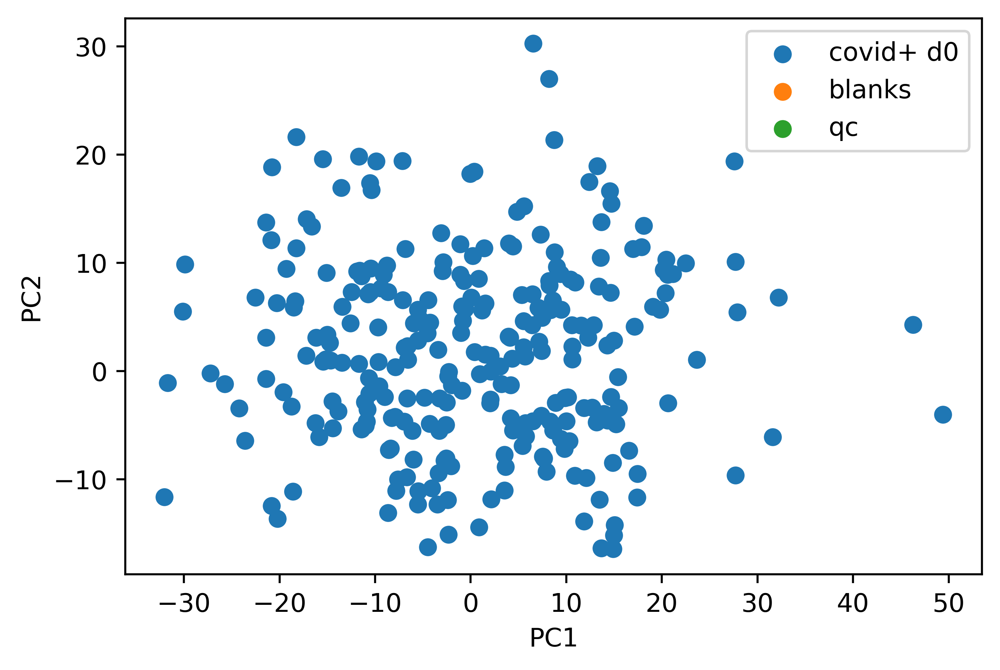

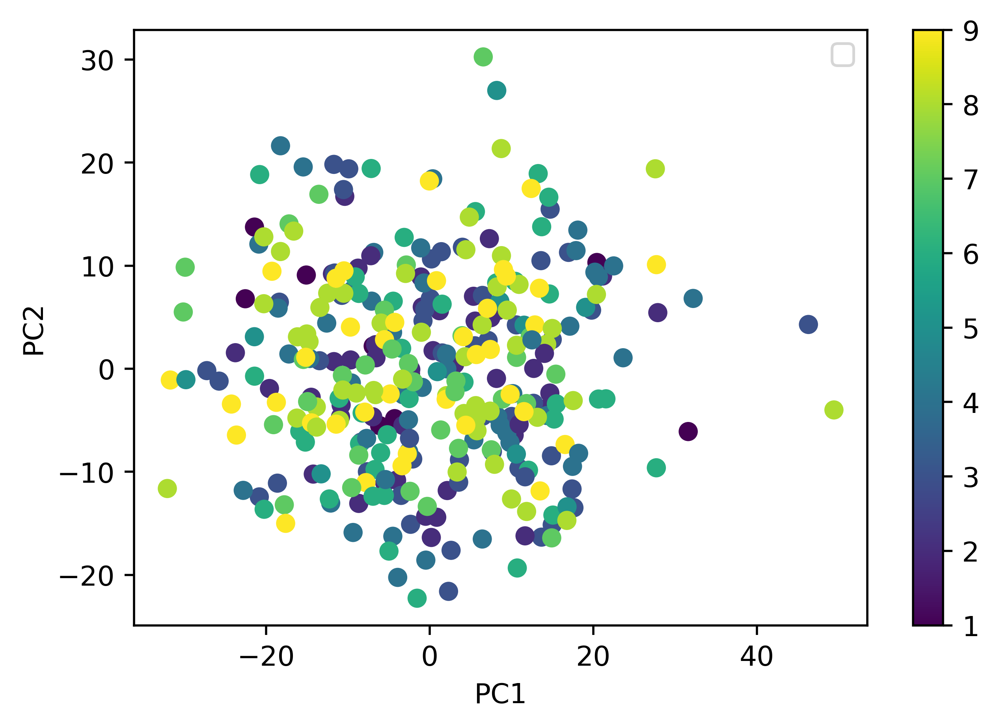

In [3]:
#visualize complete dataset

#first impute dataset
d_whole = np.concatenate((samp_int,blank_int,qc_int,val_int))
d_whole_imput = helper.imputeRowMin(d_whole)

#log2 normalize
d_whole_imput = np.log2(d_whole_imput) 

#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_imput)
loads = pca.transform(d_whole_imput)

samp_load = loads[:len(samp_int)]
blank_load = loads[len(samp_int):len(samp_int)+len(blank_int)]
qc_load = loads[len(samp_int)+len(blank_int):len(samp_int)+len(blank_int)+len(qc_int)]

#make pca plot divided by sample type
plt.scatter(samp_load[:,0],samp_load[:,1],label="covid+ d0")
plt.scatter(blank_load[:,0],blank_load[:,1],label="blanks")
plt.scatter(qc_load[:,0],qc_load[:,1],label="qc")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
batch_con = np.concatenate((samp_batch,blank_batch,qc_batch,val_batch))
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")


No handles with labels found to put in legend.


Text(0, 0.5, 'PC2')

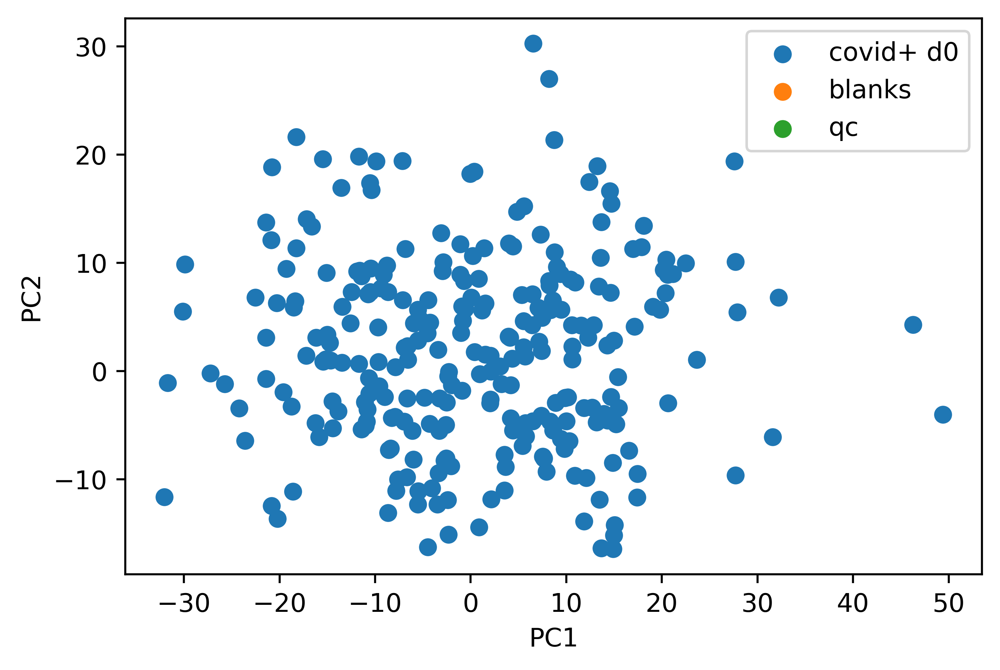

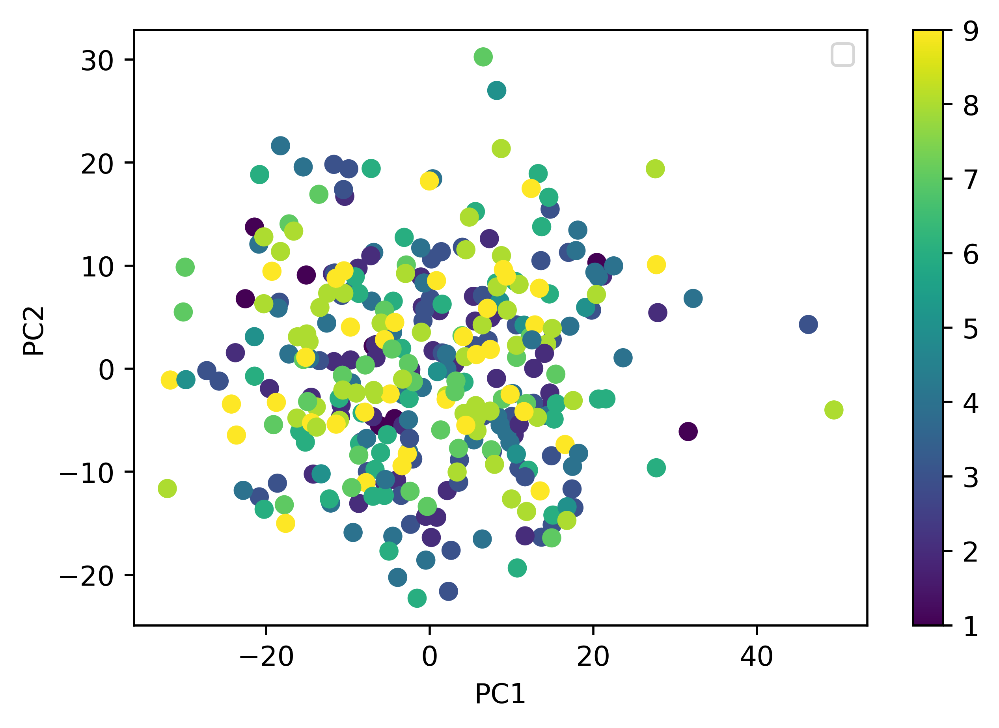

In [4]:
#now quantile normalize

d_whole_norm = d_whole_imput#combat.combat(pd.DataFrame(d_whole_imput.transpose()),np.concatenate((samp_batch,blank_batch,qc_batch,val_batch))).transpose().to_numpy()


#baseline

# if baseline == "qc":
#     # #baseline to qcSamps
#     baseInt = [np.median(x) for x in d_whole_norm[len(samp_int) + len(blank_int):].transpose()]
#     d_whole_norm = np.array([[v - med for v, med in zip(row, baseInt)] for row in d_whole_norm])

# if baseline == "all":
#     baseInt = [np.median(x) for x in d_whole_norm.transpose()]
#     d_whole_norm = np.array([[v - med for v, med in zip(row, baseInt)] for row in d_whole_norm])




#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

samp_load = loads[:len(samp_int)]
blank_load = loads[len(samp_int):len(samp_int)+len(blank_int)]
qc_load = loads[len(samp_int)+len(blank_int):len(samp_int)+len(blank_int)+len(qc_int)]

#make pca plot divided by sample type
plt.scatter(samp_load[:,0],samp_load[:,1],label="covid+ d0")
plt.scatter(blank_load[:,0],blank_load[:,1],label="blanks")
plt.scatter(qc_load[:,0],qc_load[:,1],label="qc")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

#make pca plot by batch
plt.figure()
batch_con = np.concatenate((samp_batch,blank_batch,qc_batch,val_batch))
plt.scatter(loads[:,0],loads[:,1],c=batch_con)
plt.colorbar()
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")



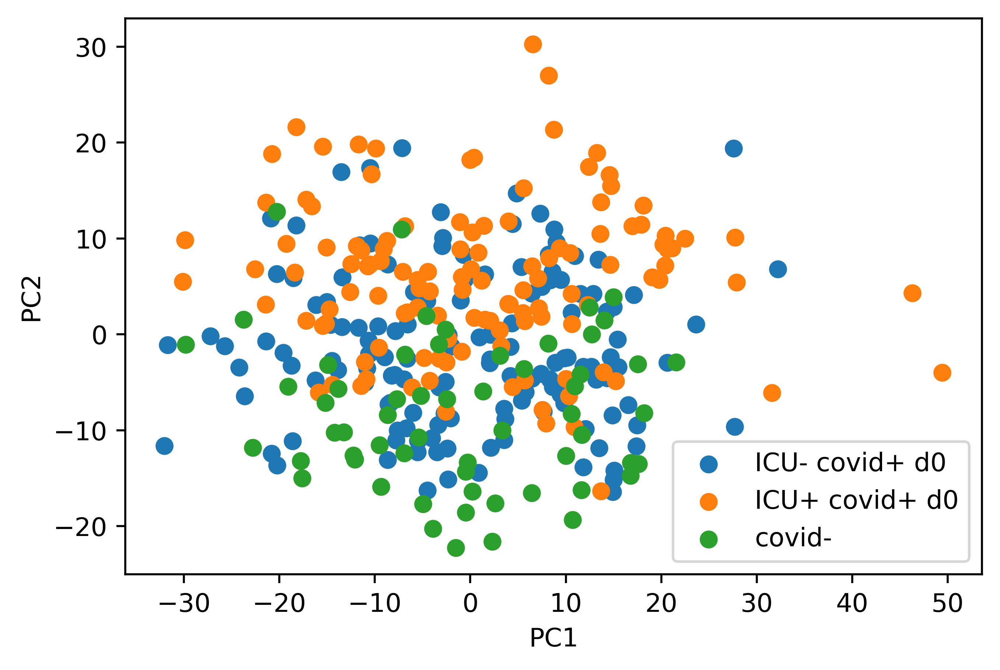

<Figure size 3000x2000 with 0 Axes>

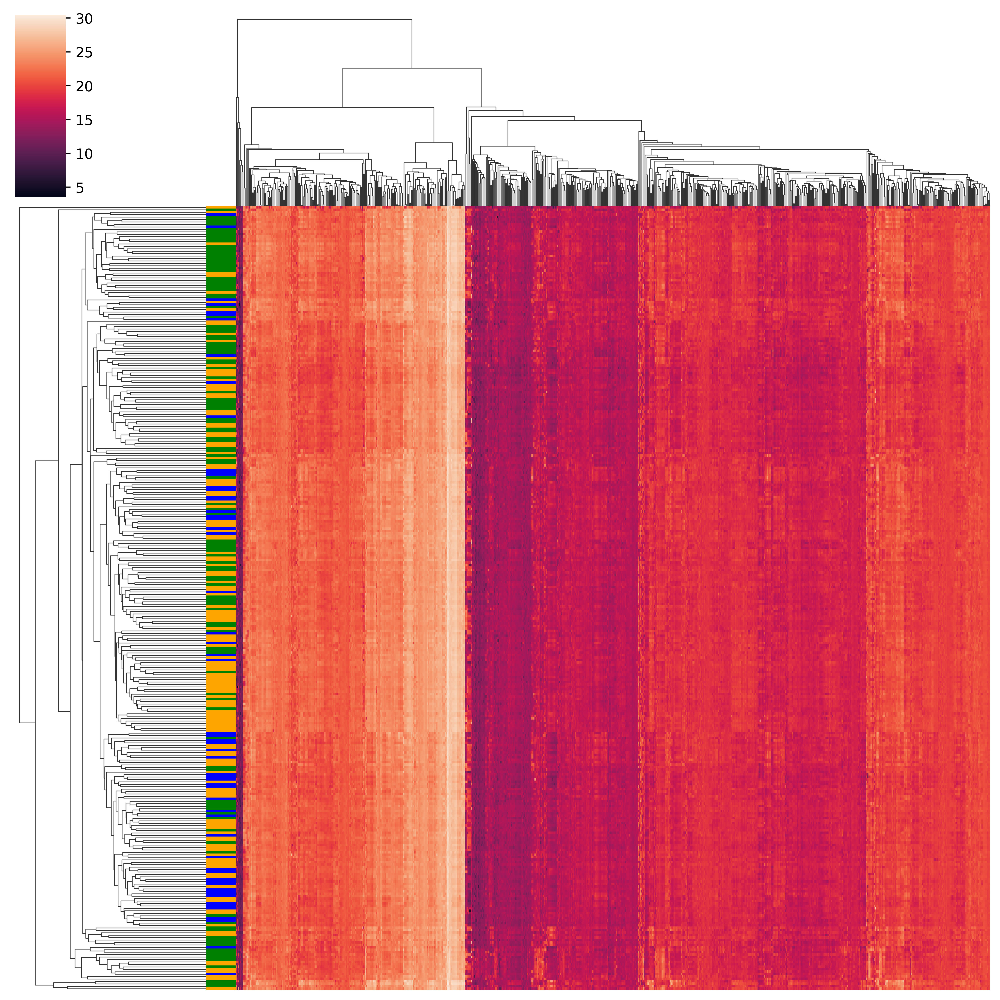

In [5]:
#now plot research samples by vent status
#do pca 
pca = PCA(n_components=2)
pca.fit(d_whole_norm)
loads = pca.transform(d_whole_norm)

#get vent pos/neg loadings
negSamples = [x for x in range(len(samp_vent)) if samp_vent[x] == 0]
posSamples = [x for x in range(len(samp_vent)) if samp_vent[x] == 1]
samp_load_vent_neg = loads[:len(samp_int)][negSamples]
samp_load_vent_pos = loads[:len(samp_int)][posSamples]

#get blanks and qc
blank_load = loads[len(samp_int):len(samp_int)+len(blank_int)]
qc_load = loads[len(samp_int)+len(blank_int):len(samp_int)+len(blank_int)+len(qc_int)]
val_load = loads[len(samp_int)+len(blank_int)+len(qc_int):]

#make pca plot divided by sample type
plt.scatter(samp_load_vent_neg[:,0],samp_load_vent_neg[:,1],label="ICU- covid+ d0")
plt.scatter(samp_load_vent_pos[:,0],samp_load_vent_pos[:,1],label="ICU+ covid+ d0")
#plt.scatter(blank_load[:,0],blank_load[:,1],label="blanks")
#plt.scatter(qc_load[:,0],qc_load[:,1],label="qc")
plt.scatter(val_load[:,0],val_load[:,1],label="covid-")
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")

plt.figure()

colors = ["blue" for _ in d_whole_norm]
for x in negSamples:
    colors[x] = "orange"
for x in posSamples:
    colors[x] = "green"
sb.clustermap(d_whole_norm,xticklabels=False,yticklabels=False,row_colors=colors)

In [6]:
#create train and test sets for prediction model

#train batches on 1-4
#test on 5-6

trainBatches = [1,2,3,4,5,6]
testBatches = [7,8,9]


#get blanks for train/test
blank_train_index = [x for x in range(len(blank_batch)) if blank_batch[x] in trainBatches]
blank_test_index = [x for x in range(len(blank_batch)) if blank_batch[x] in testBatches]

blank_train_int = blank_int[blank_train_index]
blank_test_int = blank_int[blank_test_index]

blank_train_batch = blank_batch[blank_train_index]
blank_test_batch = blank_batch[blank_test_index]

#get samples for train/test
samp_train_index = [x for x in range(len(samp_batch)) if samp_batch[x] in trainBatches]
samp_test_index = [x for x in range(len(samp_batch)) if samp_batch[x] in testBatches]

samp_train_int = samp_int[samp_train_index]
samp_test_int = samp_int[samp_test_index]

samp_train_vent = samp_vent[samp_train_index]
samp_test_vent = samp_vent[samp_test_index]

samp_train_batch = samp_batch[samp_train_index]
samp_test_batch = samp_batch[samp_test_index]

samp_train_metadata = [samp_metadata[x] for x in samp_train_index]
samp_test_metadata = [samp_metadata[x] for x in samp_test_index]

#get qc for train/test

qc_train_index = [x for x in range(len(qc_batch)) if qc_batch[x] in trainBatches]
qc_test_index = [x for x in range(len(qc_batch)) if qc_batch[x] in testBatches]

qc_train_int = qc_int[qc_train_index]
qc_test_int = qc_int[qc_test_index] 

qc_train_batch = qc_batch[qc_train_index]
qc_test_batch = qc_batch[qc_test_index] 

#need to add vent and qcs

print("training examples: ",len(samp_train_int),"testing examples: ",len(samp_test_int))
print("training ICU+ examples:, ",len([x for x in samp_train_vent if x == 1]),
      "training ICU- examples:, ",len([x for x in samp_train_vent if x == 0]))
print("testing ICU+ examples:, ",len([x for x in samp_test_vent if x == 1]),
      "testing ICU- examples:, ",len([x for x in samp_test_vent if x == 0]))

training examples:  165 testing examples:  98
training ICU+ examples:,  83 training ICU- examples:,  82
testing ICU+ examples:,  40 testing ICU- examples:,  58


In [7]:
# X_train,y_train,X_test,y_test,X_train_blank = samp_train_int,samp_train_vent,samp_test_inthelper.normalize_data(samp_train_int,blank_train_int,qc_train_int,np.concatenate((samp_test_int,val_int,samp_confirm_int)), blank_test_int, qc_test_int,samp_train_batch,
#                            blank_train_batch, qc_train_batch, np.concatenate((samp_test_batch,val_batch,samp_confirm_batch)), blank_test_batch, qc_test_batch,samp_train_vent,np.concatenate((samp_test_vent,val_vent,samp_confirm_vent)),baseline)
# X_test,X_val,X_confirm = X_test[:len(samp_test_batch)],X_test[len(samp_test_batch):len(samp_test_batch)+len(val_batch)],X_test[len(samp_test_batch)+len(val_batch):]
# y_test,y_val,y_confirm = y_test[:len(samp_test_batch)],y_test[len(samp_test_batch):len(samp_test_batch)+len(val_batch)],y_test[len(samp_test_batch)+len(val_batch):]

X_train = np.log2(samp_train_int)
y_train = samp_train_vent

X_test = np.log2(samp_test_int)
y_test = samp_test_vent

X_train_blank = np.log2(blank_train_int)

X_val = np.log2(val_int)
y_val = val_vent


X_train_metadata = samp_train_metadata
X_test_metadata = samp_test_metadata



In [8]:
#set number of processors (n) and number of splits (k)
k = 20#20#len(samp_train_int)
n = 20
fc_to_test = [1]
alpha_to_test = [1e-3,1e-2,0.05,0.10,1.0]
methods = ["corr","stat"]
num_corr = np.linspace(0,1,10)
feat_params = []
for meth in methods:
    if meth == "corr":
        for nc in num_corr:
            feat_params.append((meth,nc))
    elif meth == "stat":
        for a in alpha_to_test:
            for fc in fc_to_test:
                feat_params.append((meth,a,fc))

#define model names, functions, and hyper parameters to test
model_names = ["Logistic Regression","ElasticNet","PLSDA","SVM","Random Forest"]
model_parameter_lists = [{"feat_selection":feat_params,"C":[0.001,0.01,.1,1,10,100],"l1_ratio":np.linspace(0,1,10)},
                         {"feat_selection":feat_params,"alpha":[0.001,0.01,.1,1,10,100],"l1_ratio":np.linspace(0,1,10)},
                         {"feat_selection":feat_params,"n_components":range(1,10)},
                         {"feat_selection":feat_params,"C":[1e-3,1e-2,1e-1,1,10,100],"kernel":["linear","poly","rbf","sigmoid"]},
                         {"feat_selection":feat_params,"max_features":["auto","log2",None],"max_depth":[None,1,5,10,20,50],"n_estimators": [int(x) for x in np.linspace(1,200,5)]}]

model_train_funcs = [helper.trainLogisticRegression,helper.trainElasticNet,helper.trainPLSDA,helper.trainSVM,helper.trainRF]
model_predict_funcs = [helper.predictLogisticRegression,helper.predictElasticNet,helper.predictPLSDA,helper.predictSVM,helper.predictRF]

#structure to store results
modeling_results_dict = {}
modeling_results_dict_training = {}
index = 0

if __name__ ==  '__main__': 
    #iterate over baselining methods
    for baseline in ["none"]:#,"all"]:
        
        #get normalized training and testing data
        
        #iterate over model types
        for name,paramsToTry,trainFunc,predictFunc in zip(model_names,model_parameter_lists,model_train_funcs,model_predict_funcs):

            #optimize hyper parameters        
            results,err_cv,bestParams,log_pred = helper.optimizeHyperParams(paramsToTry,X_train,y_train,X_train_blank,mol_names,trainFunc,predictFunc,k=k,n=n)
            print(baseline,name)
            #get best parameters
            print(bestParams)
            plt.figure()
            selected_feats = helper.featureSelection(X_train,y_train,X_train_blank,mol_names,bestParams["feat_selection"],False,False)

            y_pred = predictFunc(log_pred,X_train)

            #assess training error
            err_train = helper.score(y_pred,y_train)
            print("training score: ",err_train)

            #print(sklearn.metrics.confusion_matrix(y_train,y_pred))

            #assess cross validation error
            y_pred,y_true = helper.crossVal(X_train,y_train,X_train_blank,mol_names,trainFunc,predictFunc,bestParams,k=k,numCores=n)

            err_cv = helper.score(y_pred,y_true)
            print("cv score: ",err_cv)
            #print(sklearn.metrics.confusion_matrix(y_true,y_pred))
            modeling_results_dict[index] = {"Model":name,"Params":bestParams,"Baseline":baseline,"Score":err_cv,"Training Score":err_train}

            index += 1
            
results = pd.DataFrame.from_dict(modeling_results_dict,orient="index")
pkl.dump(results,open("modeling_results_qTOF_ICU_new.pkl","wb"))

none Logistic Regression
{'feat_selection': ('corr', 0.3333333333333333), 'C': 0.1, 'l1_ratio': 0.1111111111111111}
training score:  0.8627681457537467
cv score:  0.8014986776373787
none ElasticNet
{'feat_selection': ('corr', 0.3333333333333333), 'alpha': 10, 'l1_ratio': 0.0}
training score:  0.8824566558918602
cv score:  0.8028210402585954
none PLSDA
{'feat_selection': ('stat', 0.1, 1), 'n_components': 2}
training score:  0.8751101968851014
cv score:  0.8028210402585952
none SVM
{'feat_selection': ('stat', 0.05, 1), 'C': 0.1, 'kernel': 'rbf'}
training score:  0.7575668527769616
cv score:  0.7338377901851308
none Random Forest
{'feat_selection': ('corr', 0.6666666666666666), 'max_features': None, 'max_depth': None, 'n_estimators': 50}
training score:  1.0
cv score:  0.702982662356744


<Figure size 3000x2000 with 0 Axes>

<Figure size 3000x2000 with 0 Axes>

<Figure size 3000x2000 with 0 Axes>

<Figure size 3000x2000 with 0 Axes>

<Figure size 3000x2000 with 0 Axes>

                 Model                                             Params  \
0  Logistic Regression  {'feat_selection': ('corr', 0.3333333333333333...   
1           ElasticNet  {'feat_selection': ('corr', 0.3333333333333333...   
2                PLSDA  {'feat_selection': ('stat', 0.1, 1), 'n_compon...   
3                  SVM  {'feat_selection': ('stat', 0.05, 1), 'C': 0.1...   
4        Random Forest  {'feat_selection': ('corr', 0.6666666666666666...   

  Baseline     Score  Training Score  
0     none  0.801499        0.862768  
1     none  0.802821        0.882457  
2     none  0.802821        0.875110  
3     none  0.733838        0.757567  
4     none  0.702983        1.000000  
        Model                                             Params Baseline  \
1  ElasticNet  {'feat_selection': ('corr', 0.3333333333333333...     none   

      Score  Training Score  
1  0.802821        0.882457  
{'feat_selection': ('corr', 0.3333333333333333), 'alpha': 10, 'l1_ratio': 0.0}


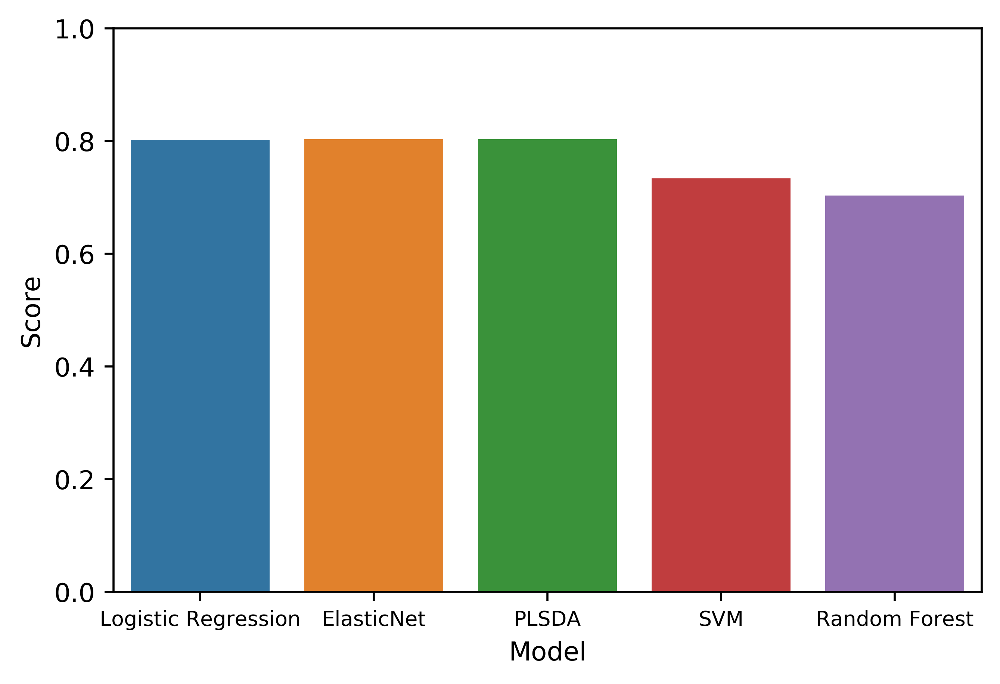

In [9]:
results = pkl.load(open("modeling_results_qTOF_ICU_new.pkl","rb"))
#plot results
print(results)

results = results[results["Baseline"] == "none"]
sb.barplot(x="Model",y="Score",data=results)
plt.xticks(fontsize=8)
plt.ylim((0,1))

#print(results)
results = results[results["Score"] < results["Training Score"]]
#results = results[results["Score"] > results["Training Score"] * 2/3]
bestParams = results[results["Score"] == results["Score"].max()]
ind = bestParams.index.values[0]
print(bestParams)
print(bestParams.at[ind,"Params"])
baseline = bestParams.at[ind,"Baseline"]
params = bestParams.at[ind,"Params"]
model = bestParams.at[ind,"Model"]
model_names = ["Logistic Regression","ElasticNet","PLSDA","SVM","Random Forest"]
model_train_funcs = [helper.trainLogisticRegression,helper.trainElasticNet,helper.trainPLSDA,helper.trainSVM,helper.trainRF]
model_predict_funcs = [helper.predictLogisticRegression,helper.predictElasticNet,helper.predictPLSDA,helper.predictSVM,helper.predictRF]
train_mapping = {name:func for name,func in zip(model_names,model_train_funcs)}
predict_mapping = {name:func for name,func in zip(model_names,model_predict_funcs)}

trainFunc,predictFunc = train_mapping[model],predict_mapping[model]





training score:  0.8824566558918602
testing score:  0.7232758620689654


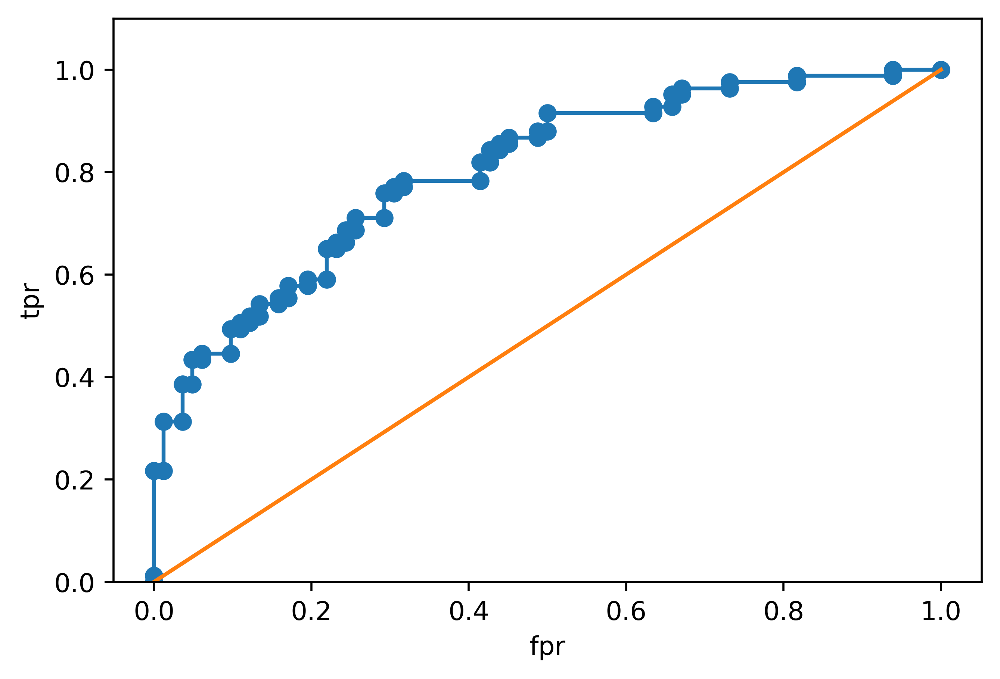

In [10]:
#fit model
feat_params = params["feat_selection"]

y_pred_cv,y_cv = helper.crossVal(X_train,y_train,X_train_blank,mol_names,trainFunc,predictFunc,params,k=20,numCores=20)

selected_feats = helper.featureSelection(X_train,y_train,X_train_blank,mol_names,feat_params,True,True)
X_train_sig = X_train[:,selected_feats]
obj = trainFunc(X_train, y_train, X_train_blank, mol_names, params)

#predict
y_pred_train = predictFunc(obj,X_train)

#assess training error
err_train = helper.score(y_pred_train,y_train)
print("training score: ",err_train)
#print(sklearn.metrics.confusion_matrix(y_train,y_pred))

plt.figure()

fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_cv,y_pred_cv)
plt.plot(fpr,tpr)
plt.scatter(fpr,tpr)
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.ylim((0,1.1))
plt.plot([0,1],[0,1])
# for p,r,t in zip(precision,recall,thresolds):
#     print(p,r,t)

#assess testing error
y_test_pred = predictFunc(obj,X_test)

err_test = helper.score(y_test_pred,y_test)
print("testing score: ",err_test)
#print(sklearn.metrics.confusion_matrix(y_test,y_test_pred))

y_neg_pred = [y_test_pred[i] for i in range(len(y_test_pred)) if y_test[i] < .5]
y_pos_pred = [y_test_pred[i] for i in range(len(y_test_pred)) if y_test[i] > .5]

y_val_pred = predictFunc(obj,X_val)

    





3


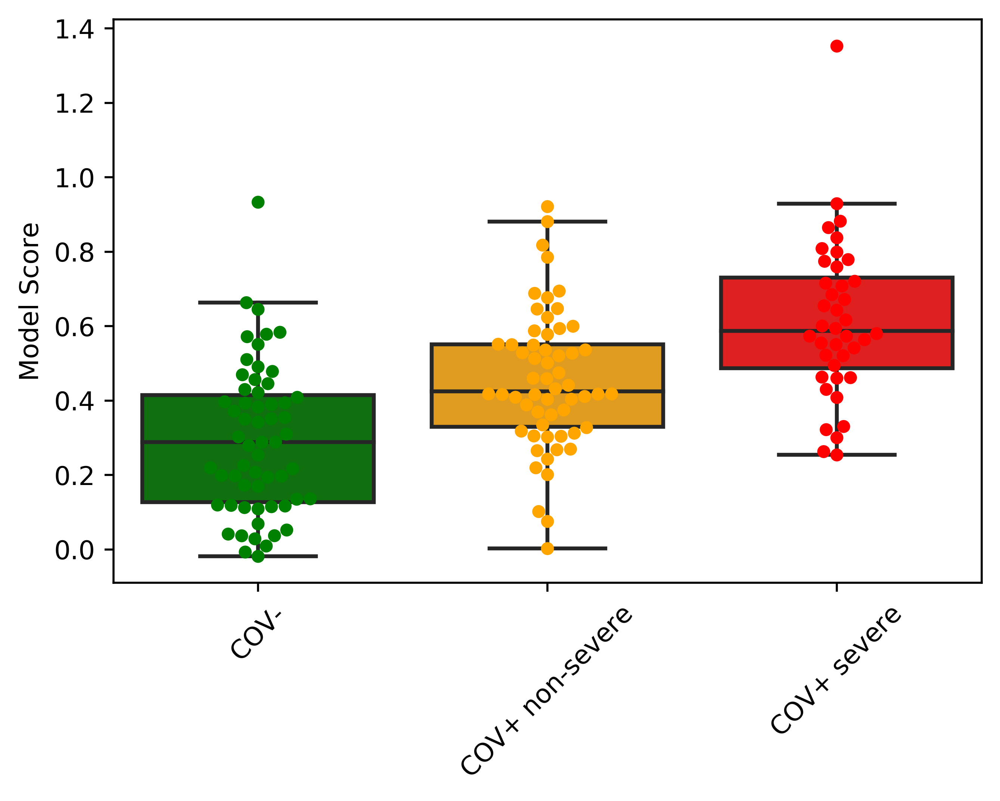

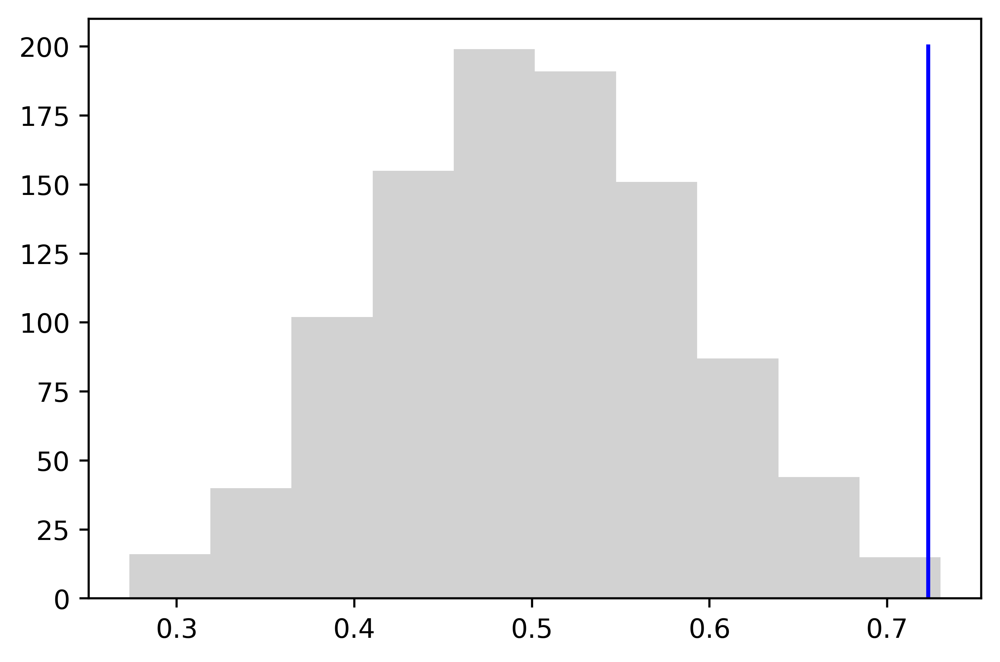

In [11]:
thresh = 0.56
plot_df = {}
ind = 0
for x in y_val_pred:
    plot_df[ind] = {"Status":"COV-","Model Score":x}
    ind += 1

for x in y_neg_pred:
    plot_df[ind] = {"Status":"COV+ non-severe","Model Score":x}
    ind += 1

for x in y_pos_pred:
    plot_df[ind] = {"Status":"COV+ severe","Model Score":x}
    ind += 1

plot_df = pd.DataFrame.from_dict(plot_df,orient="index")
sb.boxplot(data=plot_df,x="Status",y="Model Score",fliersize=0,palette={"COV-":"green",
                                                                        "COV+ non-severe":"orange",
                                                                        "COV+ severe":"red"})

sb.swarmplot(data=plot_df,x="Status",y="Model Score",palette={"COV-":"green",
                                                                        "COV+ non-severe":"orange",
                                                                        "COV+ severe":"red"},dodge=True)
plt.xticks(rotation=45)
plt.xlabel("")
#plt.plot(range(1,4),[thresh for _ in range(1,4)])

#y_val_pred_bin = binarize(y_val_pred,thresh)
#y_test_pred_bin = binarize(y_test_pred,thresh)

# print(sklearn.metrics.confusion_matrix(y_val,y_val_pred_bin))
# print(sklearn.metrics.confusion_matrix(y_test,y_test_pred_bin))



#permutation test
numPerm = 1000
res = []
fprs_tprs = []
for _ in range(numPerm):
    order = list(range(len(y_train)))
    rd.shuffle(order)
    y_shuff = np.array([y_train[x] for x in order])
    obj = trainFunc(X_train, y_shuff, X_train_blank, mol_names, params)
    y_pred = predictFunc(obj,X_test)
    err_shuff = helper.score(y_pred,y_test)
    res.append(err_shuff)
    fpr,tpr,_ = sklearn.metrics.roc_curve(y_test,y_pred)
    fprs_tprs.append([fpr,tpr])
    
print(len([x for x in res if x > err_test]))
    
#plot histogram
plt.figure()
plt.hist(res,color="grey",alpha=.35)
plt.plot([err_test,err_test],[0,.2*numPerm],color="blue")

Ttest_indResult(statistic=-5.667298224792918, pvalue=3.8623309469951776e-08)
Ttest_indResult(statistic=1.502397251552714, pvalue=0.13425661891545806)
0.5991071428571428


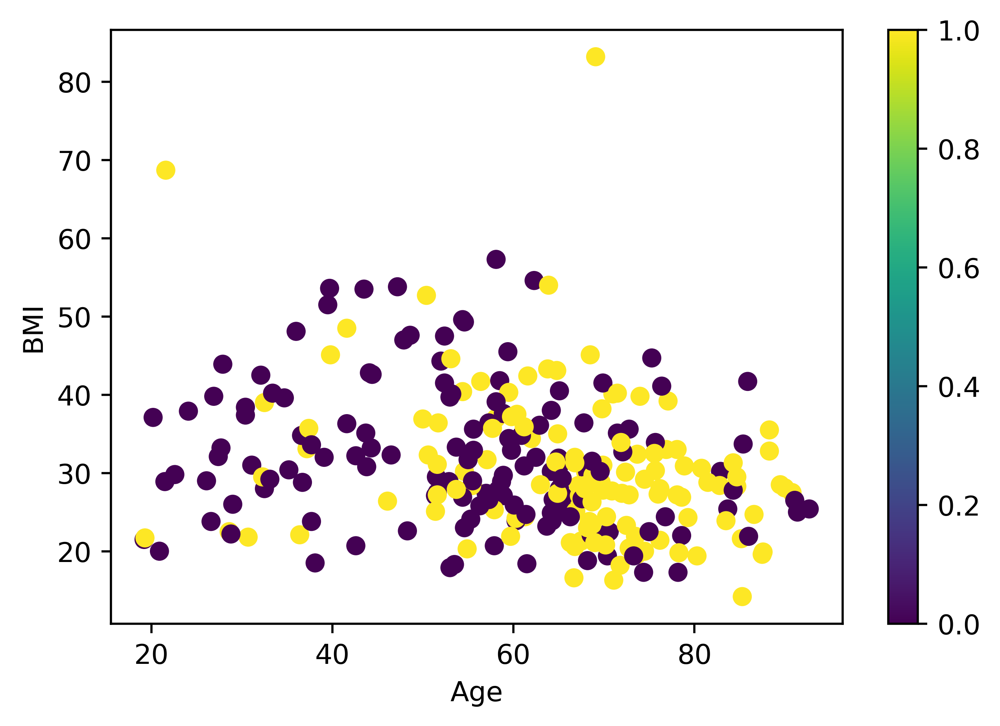

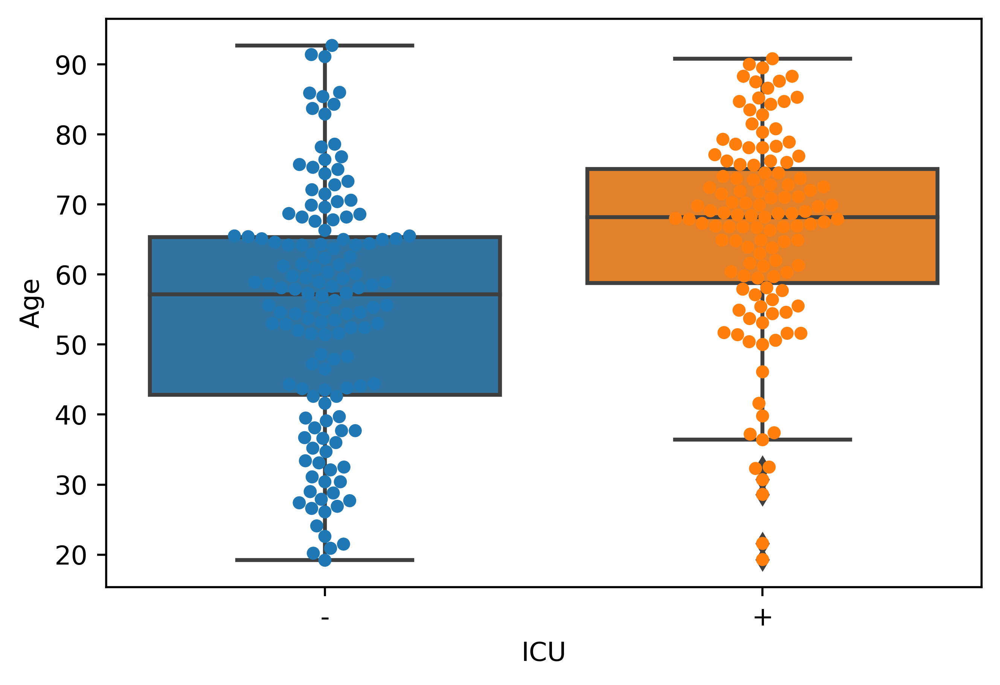

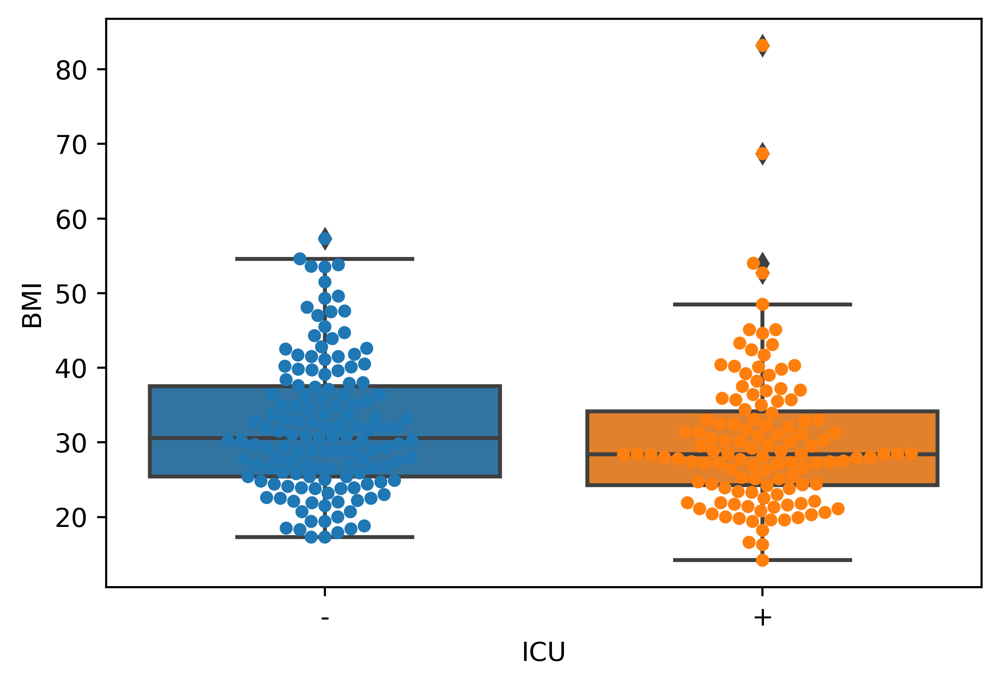

In [12]:
good_train_ind = []
for x,i in zip(X_train_metadata,range(len(X_train_metadata))):
    try: 
        float(x["Age at Symptom onset (years)"])
        float(x["BMI"])
        good_train_ind.append(i)
    except:
        pass
    
        
good_test_ind = []
for x,i in zip(X_test_metadata,range(len(X_test_metadata))):
    try: 
        float(x["Age at Symptom onset (years)"])
        float(x["BMI"])
        good_test_ind.append(i)
    except:
        pass
        


X_train_age = [float(x["Age at Symptom onset (years)"]) for x,i in zip(X_train_metadata,range(len(X_train_metadata))) if i in good_train_ind]
X_test_age = [float(x["Age at Symptom onset (years)"]) for x,i in zip(X_test_metadata,range(len(X_test_metadata))) if i in good_test_ind]
X_train_bmi = [float(x["BMI"]) for x,i in zip(X_train_metadata,range(len(X_train_metadata))) if i in good_train_ind]
X_test_bmi = [float(x["BMI"]) for x,i in zip(X_test_metadata,range(len(X_test_metadata))) if i in good_test_ind]
X_train_baseline = np.array([X_train_age,X_train_bmi]).transpose()
X_test_baseline = np.array([X_test_age,X_test_bmi]).transpose()

y_train_baseline = y_train[good_train_ind]
y_test_baseline = y_test[good_test_ind]

y_baseline = np.concatenate((y_train_baseline,y_test_baseline))

X_baseline = np.concatenate((X_train_baseline,X_test_baseline))
plt.scatter(X_baseline[:,0],X_baseline[:,1],c=y_baseline)
plt.xlabel("Age")
plt.ylabel("BMI")

negSamples_X_baseline = np.array([x for x,yy in zip(X_baseline,y_baseline) if yy < .5])
posSamples_X_baseline = np.array([x for x,yy in zip(X_baseline,y_baseline) if yy > .5])

plt.colorbar()

plt.figure()

plot_dict = {}
ind = 0
for samp in negSamples_X_baseline:
    plot_dict[ind] = {"ICU":"-","Age":samp[0],"BMI":samp[1]}
    ind += 1
    
for samp in posSamples_X_baseline:
    plot_dict[ind] = {"ICU":"+","Age":samp[0],"BMI":samp[1]}
    ind += 1

plot_df = pd.DataFrame.from_dict(plot_dict,orient="index")

sb.boxplot(data=plot_df,x="ICU",y="Age")
sb.swarmplot(data=plot_df,x="ICU",y="Age")

plt.figure()

sb.boxplot(data=plot_df,x="ICU",y="BMI")
sb.swarmplot(data=plot_df,x="ICU",y="BMI")

print(stats.ttest_ind(negSamples_X_baseline[:,0],posSamples_X_baseline[:,0],equal_var=False))
print(stats.ttest_ind(negSamples_X_baseline[:,1],posSamples_X_baseline[:,1],equal_var=False))

log_reg = sklearn.linear_model.LinearRegression(fit_intercept=True)

log_reg.fit(X_train_baseline,y_train_baseline)

pred_baseline = log_reg.predict(X_test_baseline)

print(helper.score(pred_baseline,y_test_baseline))

[0.0, 0.08620689655172414, 0.13793103448275862, 0.1724137931034483, 0.25862068965517243, 0.29310344827586204, 0.39655172413793105, 0.43103448275862066, 0.5172413793103449, 0.8103448275862069, 0.8275862068965517, 0.9137931034482759, 1.0, 0.3275862068965517, 0.6724137931034483, 0.5, 0.05172413793103448, 0.6551724137931034, 0.7413793103448276, 0.5689655172413793, 0.9827586206896551, 0.4827586206896552, 0.10344827586206896, 0.896551724137931, 0.3103448275862069, 0.22413793103448276, 0.7241379310344828, 0.017241379310344827, 0.5517241379310345, 0.6379310344827587, 0.46551724137931033, 0.9655172413793104, 0.3793103448275862, 0.8793103448275862, 0.06896551724137931, 0.15517241379310345, 0.20689655172413793, 0.7068965517241379, 0.2413793103448276, 0.7931034482758621, 0.41379310344827586, 0.6206896551724138, 0.5344827586206896, 0.4482758620689655, 0.8620689655172413, 0.9482758620689655, 0.3620689655172414, 0.7758620689655172, 0.27586206896551724, 0.1896551724137931, 0.1206896551724138, 0.603448

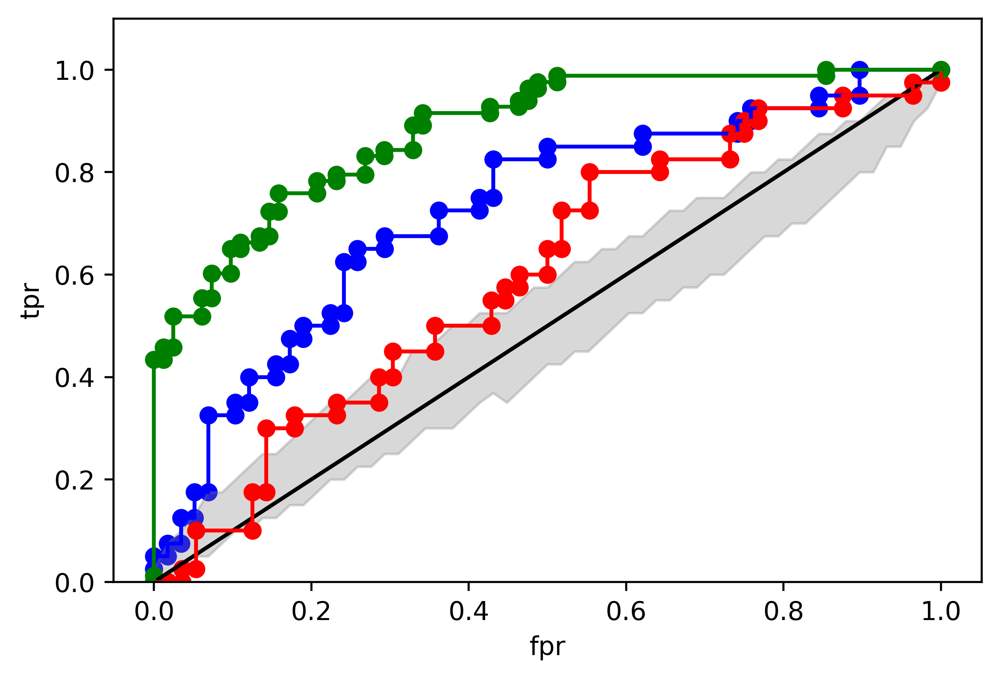

In [13]:
fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_test,y_test_pred)
plt.plot(fpr,tpr,color="blue")
plt.scatter(fpr,tpr,color="blue")
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.ylim((0,1.1))
plt.plot([0,1],[0,1],color="black")

fprs = np.array([])
for fpr,tpr in fprs_tprs:
    fprs = np.concatenate((fprs,fpr))
fprs = list(set(fprs))    
print(fprs)
matched_vals = {fpr:[] for fpr in fprs}

for fpr,tpr in fprs_tprs:
    for f,t in zip(fpr,tpr):
        matched_vals[f].append(t)
        
matched_vals = {f:[np.percentile(val,25),np.percentile(val,75)] for f,val in matched_vals.items()}
fpr_rand = list(matched_vals.keys())
fpr_rand.sort()
tpr_min = [matched_vals[f][0] for f in fpr_rand]
tpr_max = [matched_vals[f][1] for f in fpr_rand]

plt.fill_between(fpr_rand,tpr_min,tpr_max,facecolor="grey",color="grey",alpha=.3)


fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_test_baseline,pred_baseline)
plt.plot(fpr,tpr,c="red")
plt.scatter(fpr,tpr,c="red")


fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_train,y_pred_train)
plt.plot(fpr,tpr,c="green")
plt.scatter(fpr,tpr,c="green")

# fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_cv,y_pred_cv)
# plt.plot(fpr,tpr,c="orange")
# plt.scatter(fpr,tpr,c="orange")



707
235
training score:  0.8824566558918602
707


<Figure size 3000x2000 with 0 Axes>

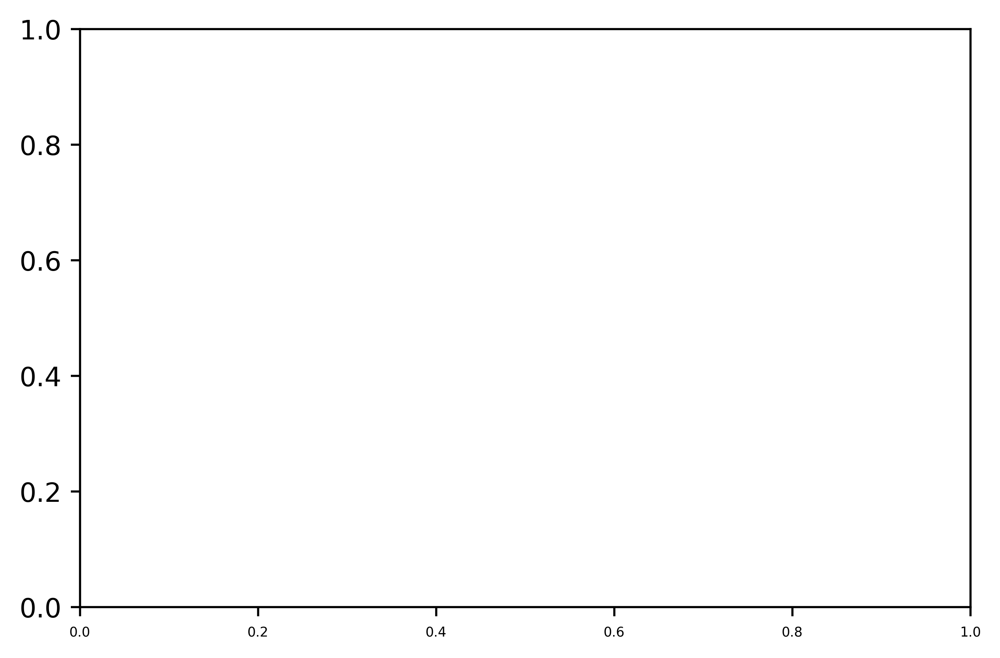

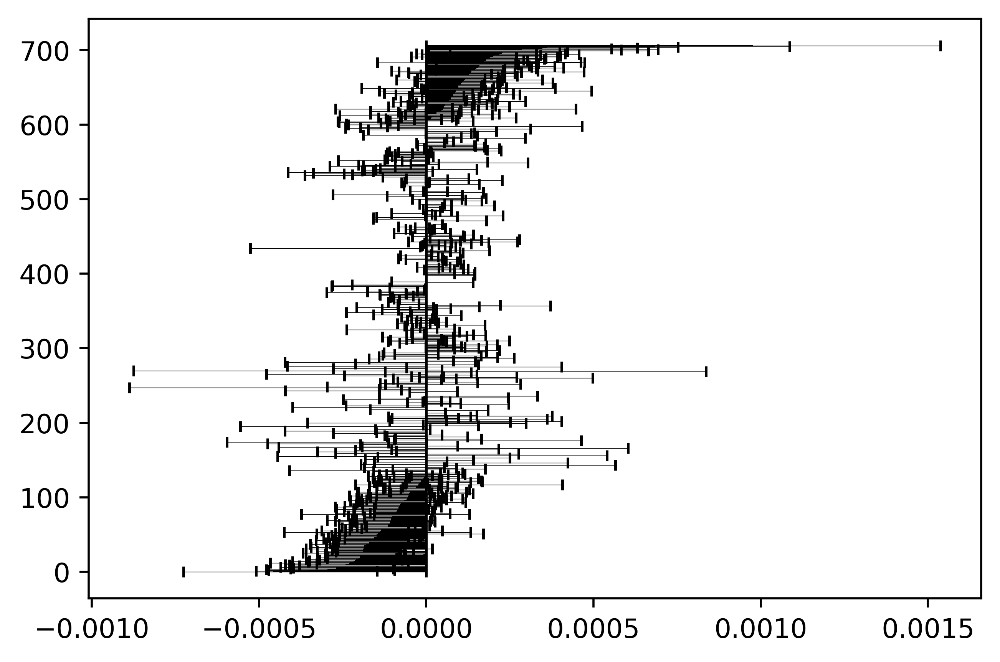

<Figure size 3000x2000 with 0 Axes>

In [14]:

#train on entire dataset
X_blank = X_train_blank

    
plt.figure()
feat_params = params["feat_selection"]
selected_feats = helper.featureSelection(X_train,y_train,X_blank,mol_names,feat_params,True,True)


#bootstrap samples
poss = list(range(len(X_train)))
numBoots = 10000
coefs = np.zeros((numBoots,len(mol_names)))
for x in range(numBoots):
    samp = rd.choices(poss,k=len(poss))
    X_temp = X_train[samp]
    y_temp = y_train[samp]
    obj = trainFunc(X_temp,y_temp,X_blank,mol_names,params)
    coefs[x][obj._selectedvars] = np.array(flatten(obj.coef_.tolist()))
    coefs[x] = np.array([coefs[x][i]/np.median(X_temp[:,i]) for i in range(len(mol_names))])
coefs = np.array(coefs).transpose()
print(len(coefs))

coefs_ci = np.array([(np.percentile(x,2.5),np.percentile(x,97.5)) for x in coefs])

print(len(selected_feats))
obj = trainFunc(X_train, y_train, X_blank, mol_names, params)
y_pred = predictFunc(obj,X_train)
err_train = helper.score(y_pred,y_train)
print("training score: ",err_train)
#print(sklearn.metrics.confusion_matrix(y,y_pred))
plt.xticks(fontsize=5)
plt.figure()


var_imp = np.zeros((len(mol_names)))
var_imp[obj._selectedvars] = np.array(flatten(obj.coef_.tolist()))
var_imp = np.array([var_imp[x]/np.median(X_train[:,x]) for x in range(len(var_imp))])

coefs_ci_normed = np.array([np.abs(r - vi) for r,vi in zip(coefs_ci,var_imp)])
print(len(var_imp))
order = list(range(len(var_imp)))
order.sort(key=lambda x:var_imp[x])
var_imp = var_imp[order]
coefs = coefs[order]
coefs_ci = coefs_ci[order]
coefs_ci_normed = coefs_ci_normed[order]

plt.barh(range(len(var_imp)),width = var_imp,xerr=[coefs_ci_normed[:,0],coefs_ci_normed[:,1]],ecolor="black",capsize=2,error_kw={"elinewidth":0.2,"barsabove":False},color="black")

plt.figure()




93


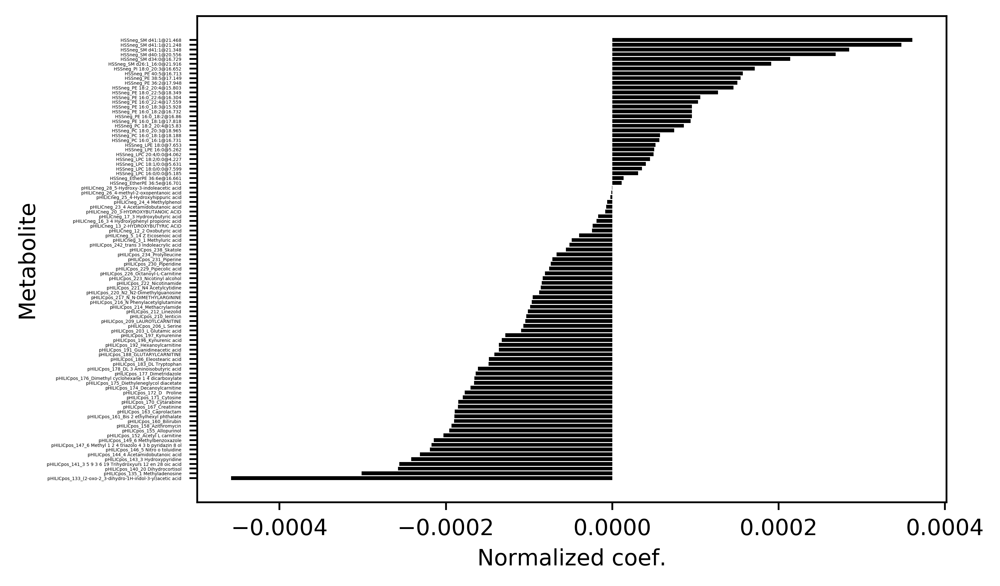

In [15]:
plt.figure()
obj = trainFunc(np.concatenate((X_train,X_test)),np.concatenate((y_train,y_test)),X_train_blank,mol_names,params)
rel = var_imp[obj._selectedvars]
print(len([x for x in rel if np.abs(x) > 0]))
names = mol_names[obj._selectedvars]
o = list(range(len(rel)))
o.sort(key=lambda x:rel[x])
o = [x for x in o if abs(rel[x]) > 0]
rel = rel[o]
names = names[o]
plt.barh(range(len(rel)),width = rel,color="black")
plt.yticks(range(len(rel)),names,fontsize=2)
plt.xlabel("Normalized coef.")
plt.ylabel("Metabolite")


tmpFile = open("../data/full_model_metabolites.csv","w")
for x in names:
    tmpFile.write(x + '\n')
tmpFile.close()

pHILICneg_77_Kynurenic acid -1.3523011335644552e-05 0.0004566427784181884
pHILICpos_196_Kynurenic acid 5.851395584813419e-06 0.0003993949917514155
30


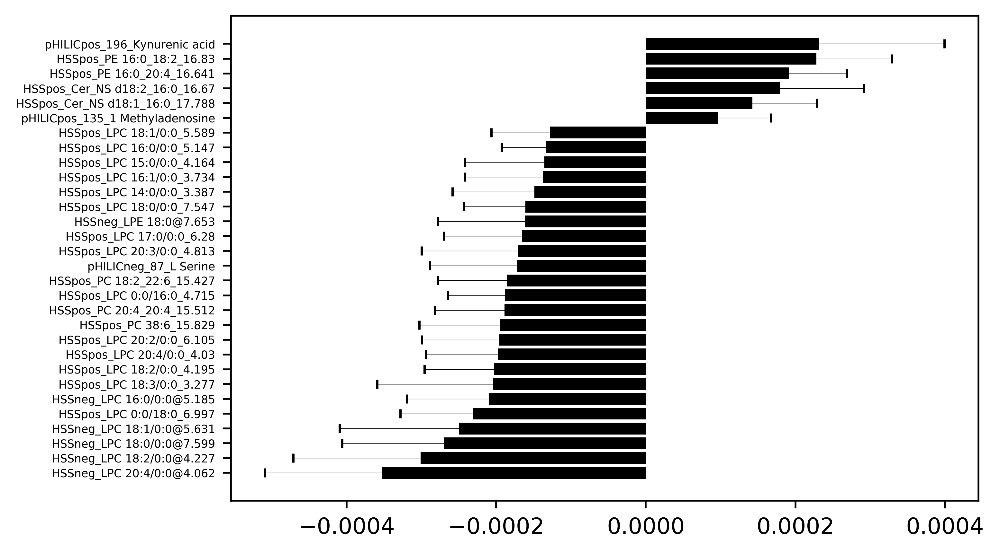

In [16]:
#filter out feats passing zero

goodMets = []
for x in range(len(coefs)):
    if coefs_ci[x][0] * coefs_ci[x][1] > 0:
        goodMets.append(x)
    if "Kynurenic" in  mol_names[order[x]]:
        print(mol_names[order[x]],coefs_ci[x][0],coefs_ci[x][1])
            
        
mol_names_sorted = mol_names[order]

plt.barh(range(len(goodMets)),width = var_imp[goodMets],xerr=[coefs_ci_normed[goodMets,0],coefs_ci_normed[goodMets,1]],ecolor="black",capsize=2,error_kw={"elinewidth":0.2,"barsabove":False},color="black")

plt.yticks(range(len(goodMets)),mol_names_sorted[goodMets],fontsize=5)
print(len(goodMets))

In [17]:
#output sig mets
goodMetDict = {}
for x in goodMets:
    print(mol_names_sorted[x])
    goodMetDict[mol_names_sorted[x]] = {"var_imp":var_imp[x],"lb":coefs_ci_normed[x,0],"ub":coefs_ci_normed[x,1]}


HSSneg_LPC 20:4/0:0@4.062
HSSneg_LPC 18:2/0:0@4.227
HSSneg_LPC 18:0/0:0@7.599
HSSneg_LPC 18:1/0:0@5.631
HSSpos_LPC 0:0/18:0_6.997
HSSneg_LPC 16:0/0:0@5.185
HSSpos_LPC 18:3/0:0_3.277
HSSpos_LPC 18:2/0:0_4.195
HSSpos_LPC 20:4/0:0_4.03
HSSpos_LPC 20:2/0:0_6.105
HSSpos_PC 38:6_15.829
HSSpos_PC 20:4_20:4_15.512
HSSpos_LPC 0:0/16:0_4.715
HSSpos_PC 18:2_22:6_15.427
pHILICneg_87_L Serine
HSSpos_LPC 20:3/0:0_4.813
HSSpos_LPC 17:0/0:0_6.28
HSSneg_LPE 18:0@7.653
HSSpos_LPC 18:0/0:0_7.547
HSSpos_LPC 14:0/0:0_3.387
HSSpos_LPC 16:1/0:0_3.734
HSSpos_LPC 15:0/0:0_4.164
HSSpos_LPC 16:0/0:0_5.147
HSSpos_LPC 18:1/0:0_5.589
pHILICpos_135_1 Methyladenosine
HSSpos_Cer_NS d18:1_16:0_17.788
HSSpos_Cer_NS d18:2_16:0_16.67
HSSpos_PE 16:0_20:4_16.641
HSSpos_PE 16:0_18:2_16.83
pHILICpos_196_Kynurenic acid


In [18]:
#remove redundancies

goodMets = [goodMets[x] for x in range(len(goodMets)) if x not in [0,1,2,3,5]]


In [19]:
#use confirm samples with signfiicant mets

k=len(X_train)
n=20

paramsToTry = model_parameter_lists[model_names.index(model)]


paramsToTry["feat_selection"] = [("corr",1.0)]

print(paramsToTry)

order = np.array(order)


_,err_cv,mod_params,log_pred = helper.optimizeHyperParams(paramsToTry,X_train[:,order[goodMets]],y_train,X_blank[:,order[goodMets]],np.array(mol_names_sorted)[goodMets],trainFunc,predictFunc,k=k,n=n)

print(err_cv,mod_params)
#mod_params = dict(params)
#mod_params["feat_selection"] = ("corr",1.0)



obj = trainFunc(X_train[:,order[goodMets]],y_train,X_blank[:,order[goodMets]],np.array(mol_names_sorted)[goodMets],mod_params)
y_pred_confirm = predictFunc(obj,X_test[:,order[goodMets]])
confirm_score = helper.score(y_pred_confirm,y_test)
print("training (b1-6): ",helper.score(predictFunc(obj,X_train[:,order[goodMets]]),y_train))
print("test (b7-9):",confirm_score )


numPerm = 1000
res = []
fprs_tprs = []
for _ in range(numPerm):
    order_t = list(range(len(y_train)))
    rd.shuffle(order_t)
    y_shuff = np.array([y_train[x] for x in order_t])
    obj = trainFunc(X_train[:,order[goodMets]], y_shuff, X_train_blank[:,order[goodMets]], np.array(mol_names_sorted)[goodMets], mod_params)
    y_pred = predictFunc(obj,X_test[:,order[goodMets]])
    err_shuff = helper.score(y_pred,y_test)
    res.append(err_shuff)
    fpr,tpr,_ = sklearn.metrics.roc_curve(y_test,y_pred)
    fprs_tprs.append([fpr,tpr])
    


{'feat_selection': [('corr', 1.0)], 'alpha': [0.001, 0.01, 0.1, 1, 10, 100], 'l1_ratio': array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ])}
0.800910960916838 {'feat_selection': ('corr', 1.0), 'alpha': 1, 'l1_ratio': 0.0}
training (b1-6):  0.8295621510431972
test (b7-9): 0.6956896551724138


5


Text(0.5, 0, '')

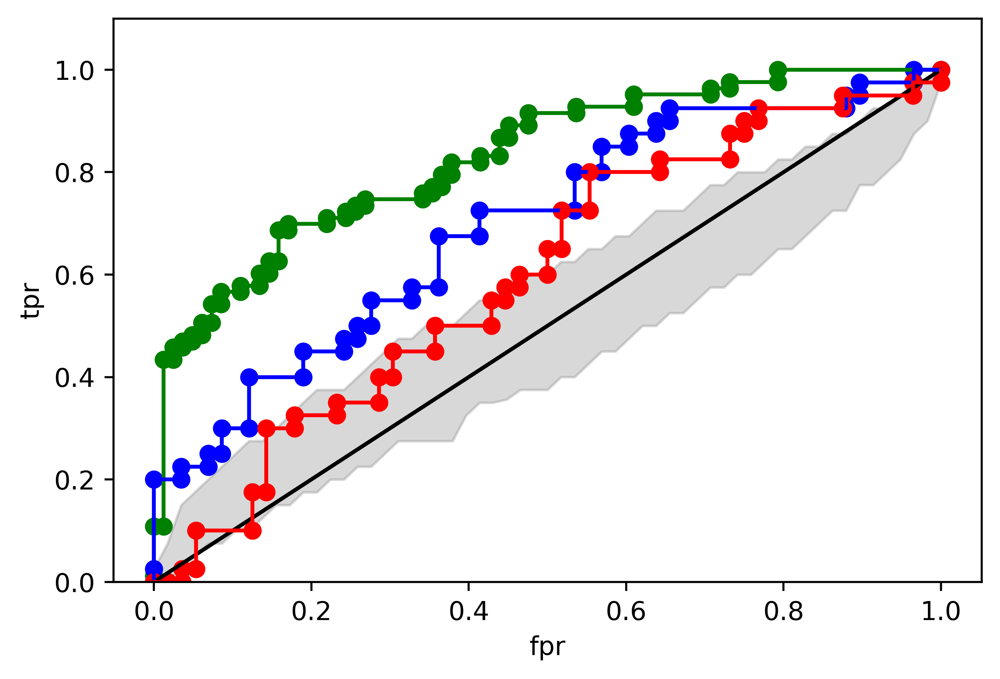

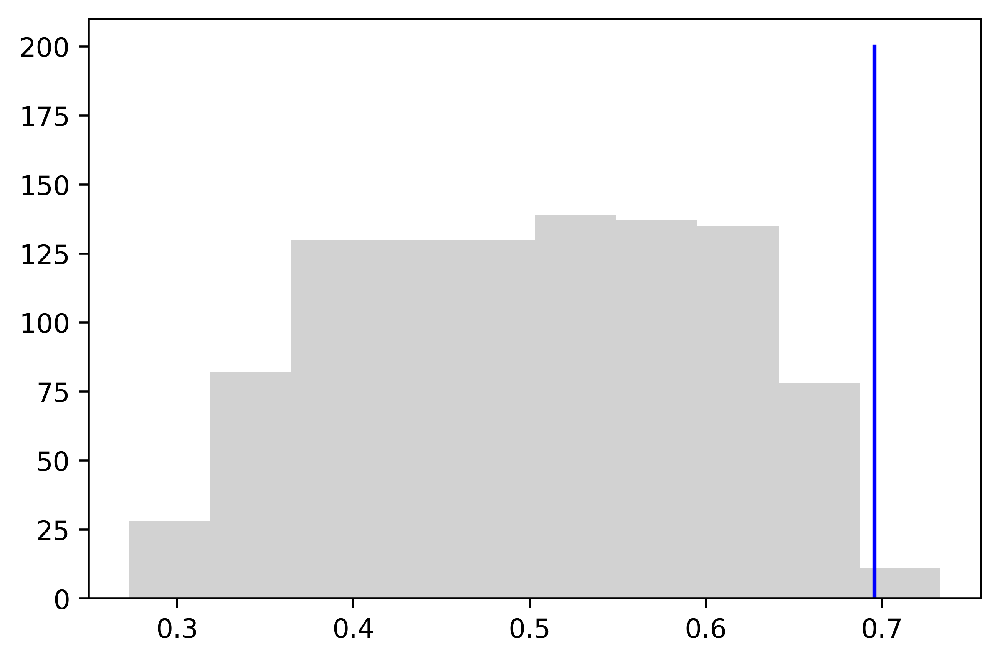

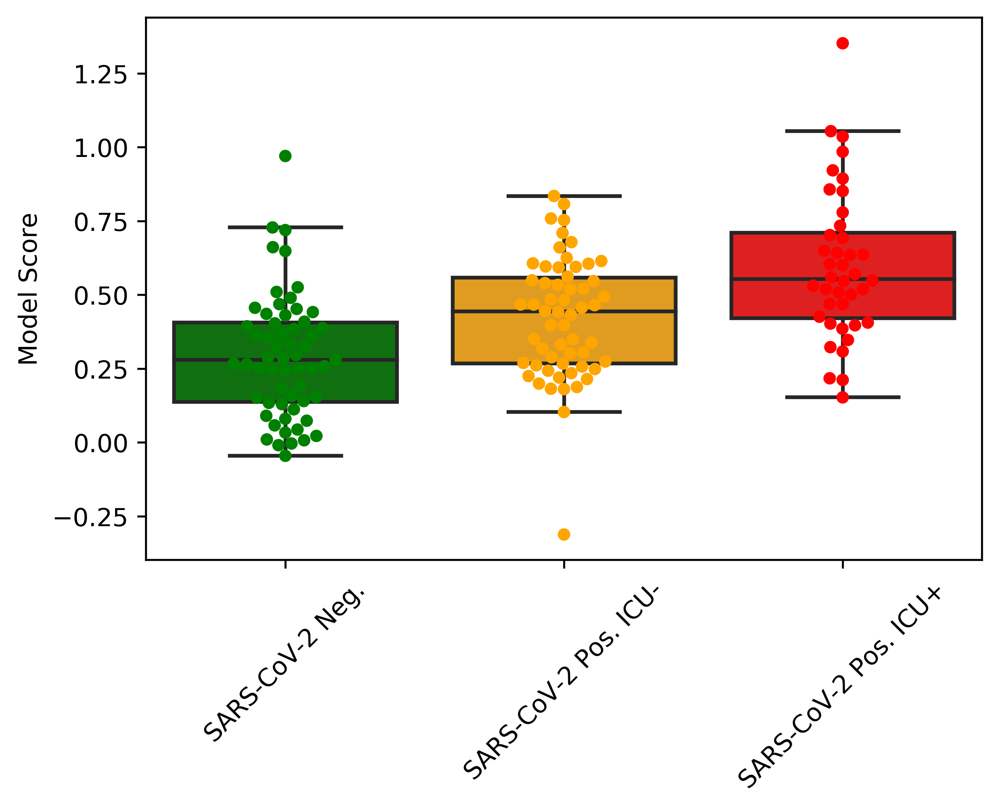

In [20]:
   
obj = trainFunc(X_train[:,order[goodMets]],y_train,X_blank[:,order[goodMets]],np.array(mol_names_sorted)[goodMets],mod_params)

    
# fpr,tpr,thresolds = sklearn.metrics.roc_curve(y,y_train_whole)
# plt.plot(fpr,tpr)
# plt.scatter(fpr,tpr)
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.ylim((0,1.1))
plt.plot([0,1],[0,1],color="black")

fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_train,predictFunc(obj,X_train[:,order[goodMets]]))
plt.plot(fpr,tpr,color="green")
plt.scatter(fpr,tpr,color="green")
    

fprs = np.array([])
for fpr,tpr in fprs_tprs:
    fprs = np.concatenate((fprs,fpr))
fprs = list(set(fprs))    
matched_vals = {fpr:[] for fpr in fprs}

for fpr,tpr in fprs_tprs:
    for f,t in zip(fpr,tpr):
        matched_vals[f].append(t)

matched_vals = {f:[np.percentile(val,25),np.percentile(val,75)] for f,val in matched_vals.items()}
fpr_rand = list(matched_vals.keys())
fpr_rand.sort()
tpr_min = [matched_vals[f][0] for f in fpr_rand]
tpr_max = [matched_vals[f][1] for f in fpr_rand]

plt.fill_between(fpr_rand,tpr_min,tpr_max,facecolor="grey",color="grey",alpha=.3)

y_pred_confirm_all = predictFunc(obj,X_test[:,order[goodMets]])

err_test = helper.score(y_pred_confirm_all,y_test)

print(len([x for x in res if x > err_test]))

fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_test,y_pred_confirm_all)
plt.plot(fpr,tpr,color="blue")
plt.scatter(fpr,tpr,color="blue")

age_train = X_train_age
bmi_train = X_train_bmi
baseline_train = np.array([age_train,bmi_train]).transpose()

baseline_test = np.array([X_test_age,X_test_bmi]).transpose()

log_reg = sklearn.linear_model.LinearRegression(fit_intercept=True)

log_reg.fit(baseline_train,np.array(y_train_baseline))

pred_baseline = log_reg.predict(baseline_test)
fpr,tpr,thresolds = sklearn.metrics.roc_curve(y_test_baseline,pred_baseline)
plt.plot(fpr,tpr,color="red")
plt.scatter(fpr,tpr,color="red")


    
#plot histogram
plt.figure()
plt.hist(res,color="grey",alpha=.35)
plt.plot([confirm_score,confirm_score],[0,.2*numPerm],color="blue")

y_val_pred = predictFunc(obj,X_val[:,order[goodMets]])
y_neg_pred = [y_pred_confirm_all[x] for x in range(len(y_test)) if y_test[x] < .5]
y_pos_pred = [y_pred_confirm_all[x] for x in range(len(y_test)) if y_test[x] > .5]


plt.figure()
plot_df = {}
ind = 0
for x in y_val_pred:
    plot_df[ind] = {"Status":"SARS-CoV-2 Neg.","Model Score":x}
    ind += 1

for x in y_neg_pred:
    plot_df[ind] = {"Status":"SARS-CoV-2 Pos. ICU-","Model Score":x}
    ind += 1

for x in y_pos_pred:
    plot_df[ind] = {"Status":"SARS-CoV-2 Pos. ICU+","Model Score":x}
    ind += 1

plot_df = pd.DataFrame.from_dict(plot_df,orient="index")
sb.boxplot(data=plot_df,x="Status",y="Model Score",fliersize=0,palette={"SARS-CoV-2 Neg.":"green",
                                                                        "SARS-CoV-2 Pos. ICU-":"orange",
                                                                        "SARS-CoV-2 Pos. ICU+":"red"})

sb.swarmplot(data=plot_df,x="Status",y="Model Score",palette={"SARS-CoV-2 Neg.":"green",
                                                                        "SARS-CoV-2 Pos. ICU-":"orange",
                                                                        "SARS-CoV-2 Pos. ICU+":"red"},dodge=True)
plt.xticks(rotation=45)
plt.xlabel("")


25


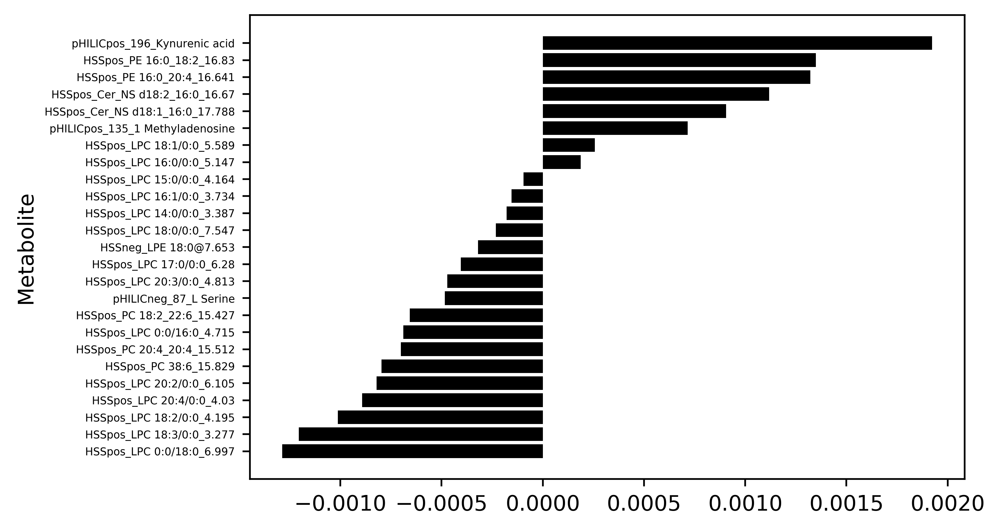

In [21]:
X_tot = np.concatenate((X_train[:,order[goodMets]],X_test[:,order[goodMets]]),axis=0)
y_tot = np.concatenate((y_train,y_test))
obj = trainFunc(X_tot,y_tot,
                X_blank[:,order[goodMets]],np.array(mol_names_sorted)[goodMets],mod_params)

var_imp_new = np.zeros((len(goodMets)))
var_imp_new[obj._selectedvars] = np.array(flatten(obj.coef_.tolist()))
var_imp_new = np.array([var_imp_new[x]/np.median(X_tot[:,x]) for x in range(len(var_imp_new))])

rel = var_imp_new[obj._selectedvars]
print(len([x for x in rel if np.abs(x) > 0]))
names =np.array(mol_names_sorted)[goodMets][obj._selectedvars]
o = list(range(len(rel)))
o.sort(key=lambda x:rel[x])
rel = rel[o]
names = names[o]
plt.barh(range(len(rel)),width = rel,color="black")
plt.yticks(range(len(goodMets)),mol_names_sorted[goodMets],fontsize=5)
#plt.xlabel("Normalized coef.")
plt.ylabel("Metabolite")

#output sig mets
goodMetDict = {}
for x in range(len(goodMets)):
    goodMetDict[mol_names_sorted[goodMets][x]] = {"var_imp":var_imp_new[x]}


pd.DataFrame.from_dict(goodMetDict,orient="index").to_csv("../data/var_importance_tmp.csv")

HSSpos_LPC 0:0/18:0_6.997 1.1440432962512332e-17
HSSpos_LPC 18:3/0:0_3.277 1.4710571510857982e-15
HSSpos_LPC 18:2/0:0_4.195 5.588143001552108e-16
HSSpos_LPC 20:4/0:0_4.03 7.218245932090633e-11
HSSpos_LPC 20:2/0:0_6.105 3.9523859343175326e-18
HSSpos_PC 38:6_15.829 2.3023671939579985e-15
HSSpos_PC 20:4_20:4_15.512 8.178788260198818e-14
HSSpos_LPC 0:0/16:0_4.715 6.587919338414923e-17
HSSpos_PC 18:2_22:6_15.427 2.0707074079070362e-13
pHILICneg_87_L Serine 2.1966811939236305e-06
HSSpos_LPC 20:3/0:0_4.813 1.3136245776929054e-16
HSSpos_LPC 17:0/0:0_6.28 1.8732882708113335e-14
HSSneg_LPE 18:0@7.653 6.485234342333072e-06
HSSpos_LPC 18:0/0:0_7.547 3.1248905146456903e-16
HSSpos_LPC 14:0/0:0_3.387 4.0408290965524276e-22
HSSpos_LPC 16:1/0:0_3.734 5.395167675304408e-19
HSSpos_LPC 15:0/0:0_4.164 2.5190804878994203e-17
HSSpos_LPC 16:0/0:0_5.147 1.2249802634639997e-15
HSSpos_LPC 18:1/0:0_5.589 3.294173804318798e-16
pHILICpos_135_1 Methyladenosine 7.268933187937411e-11
HSSpos_Cer_NS d18:1_16:0_17.788 9.

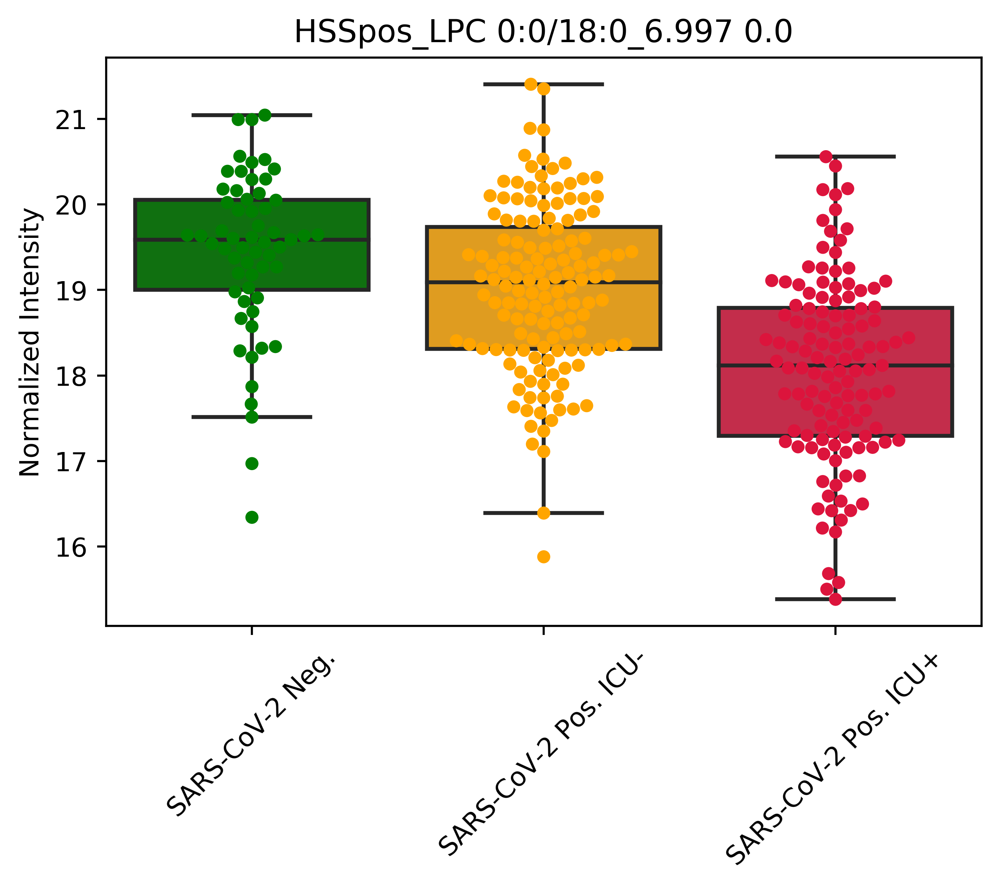

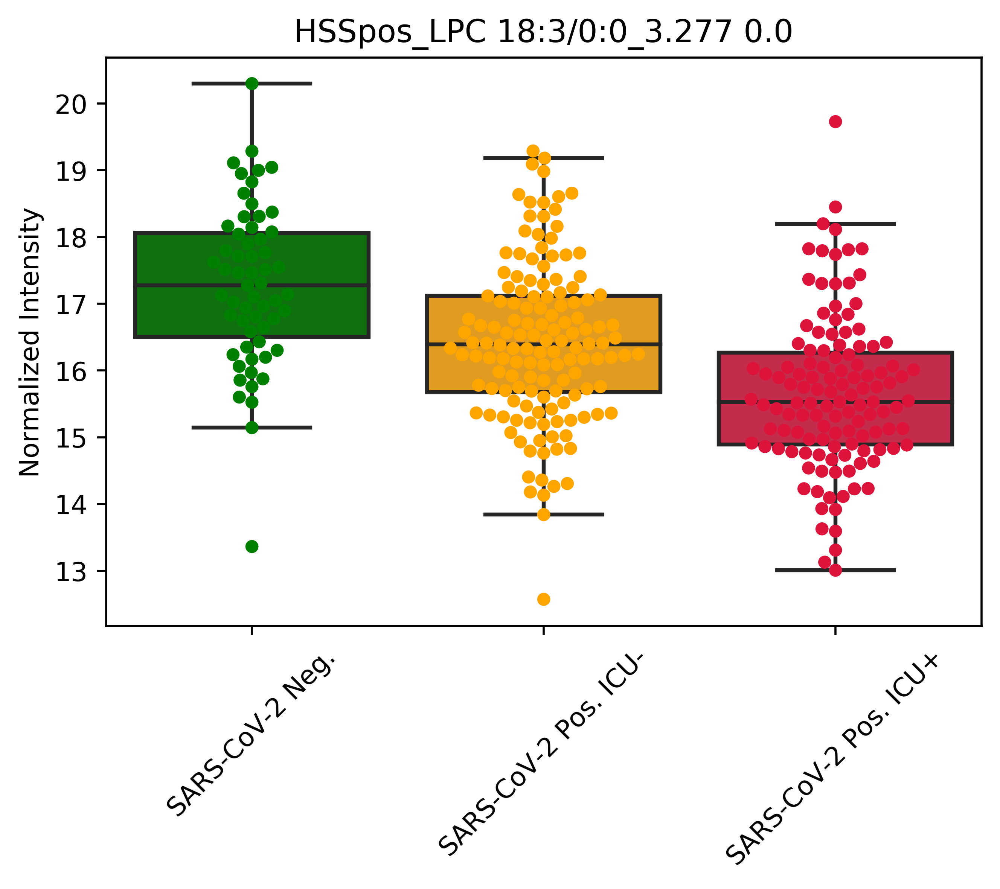

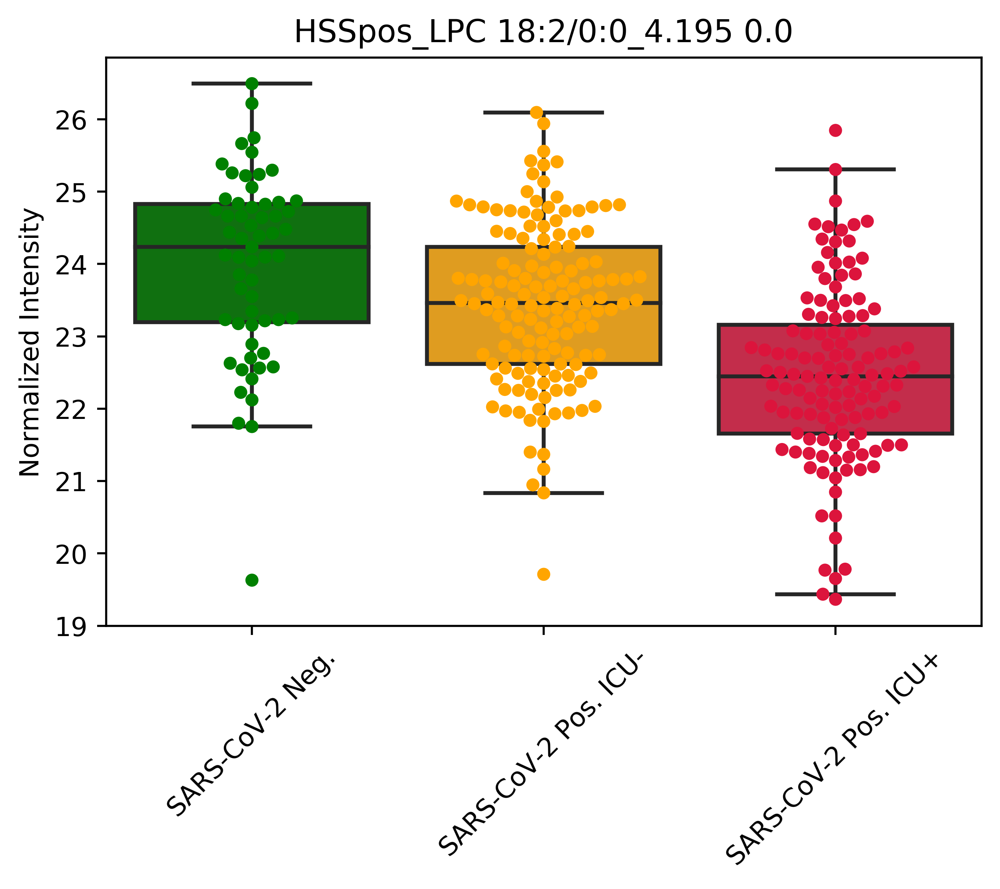

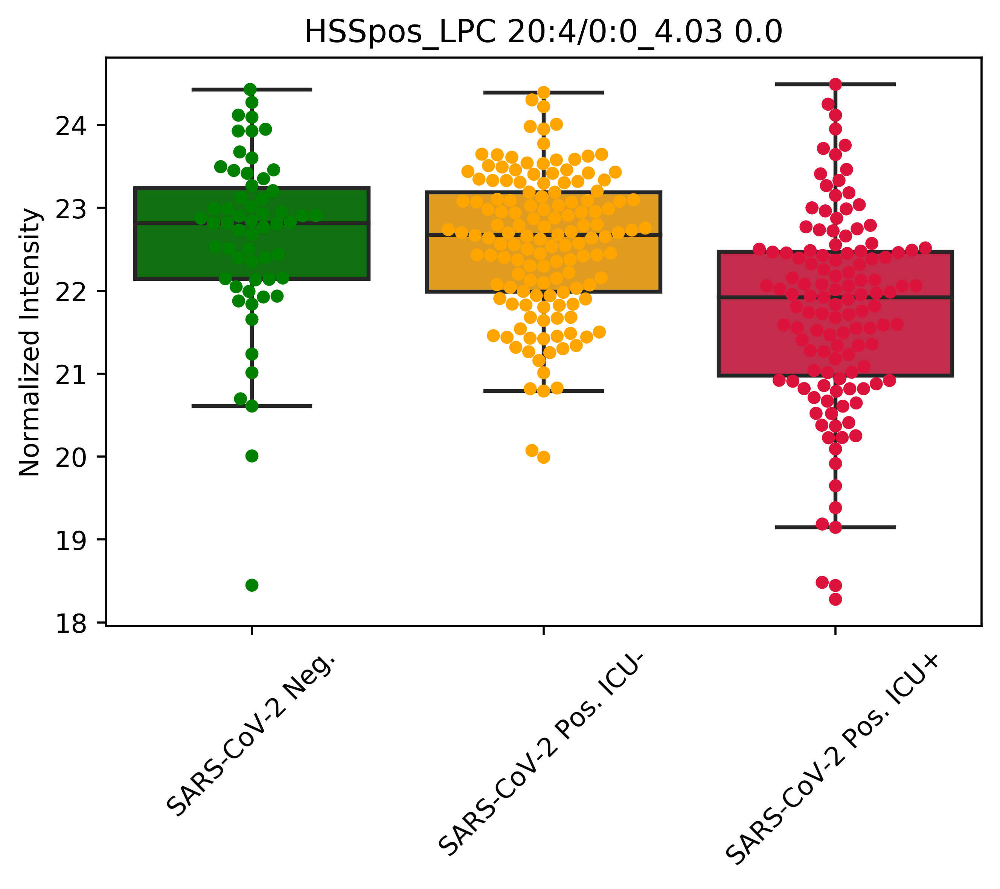

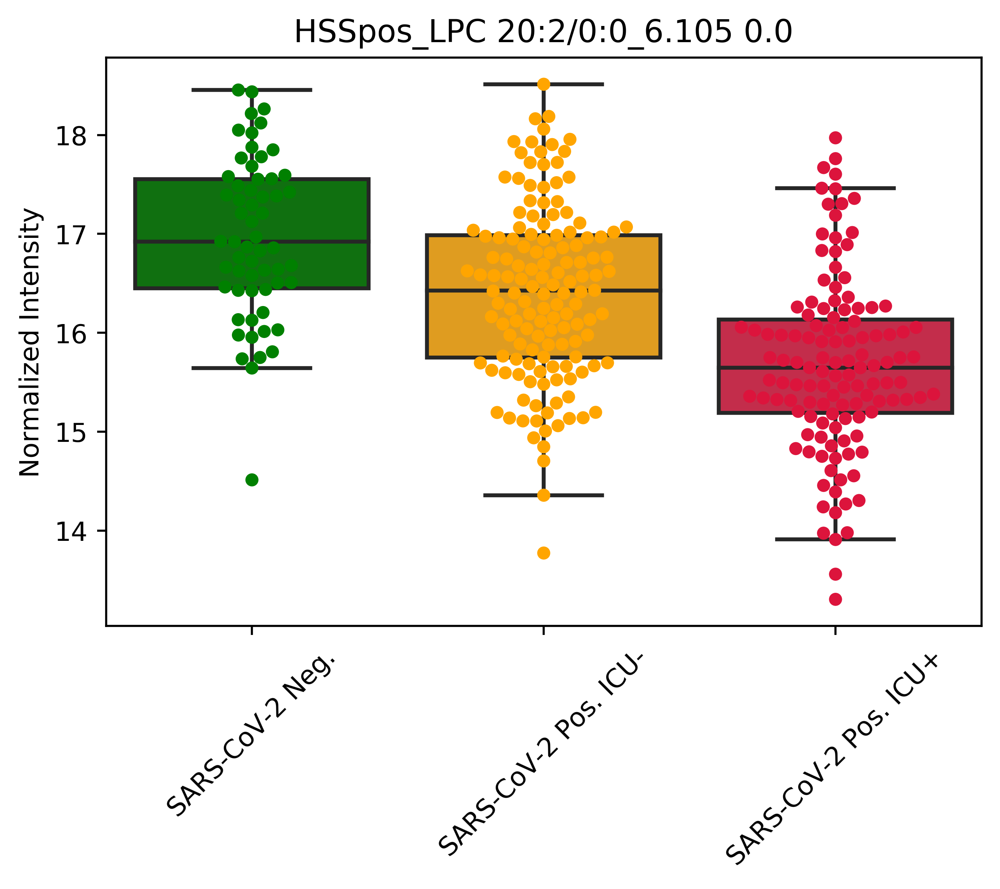

...

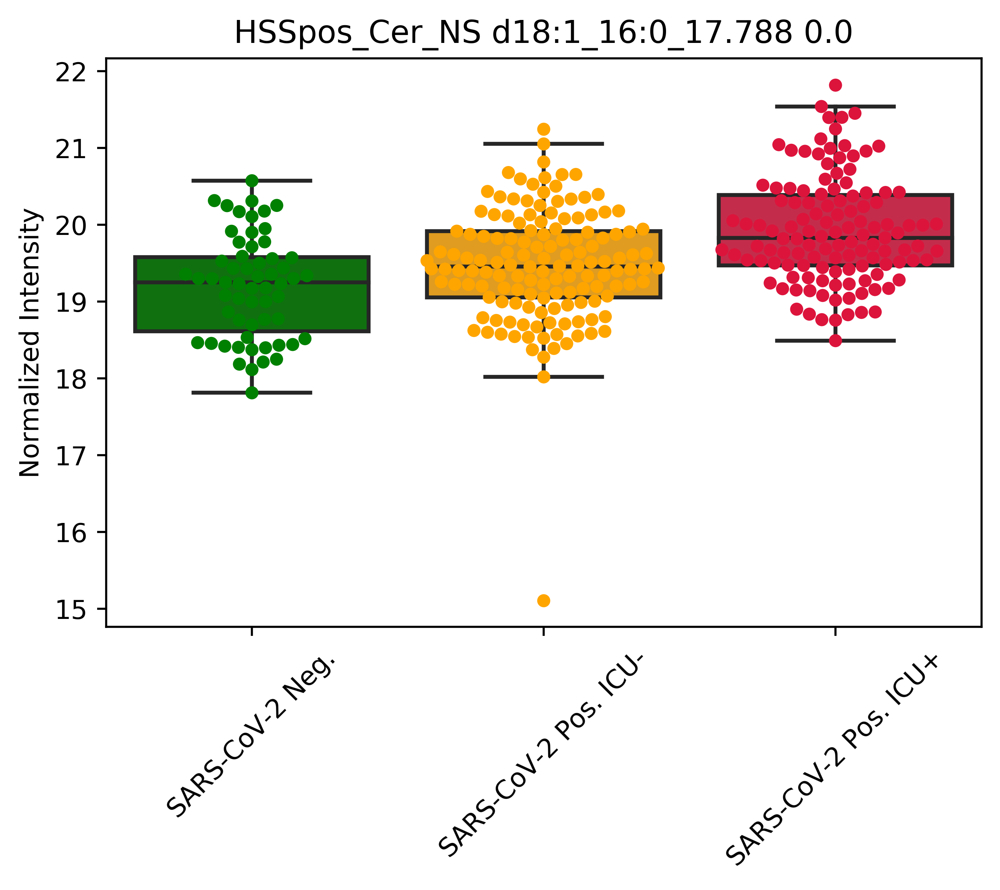

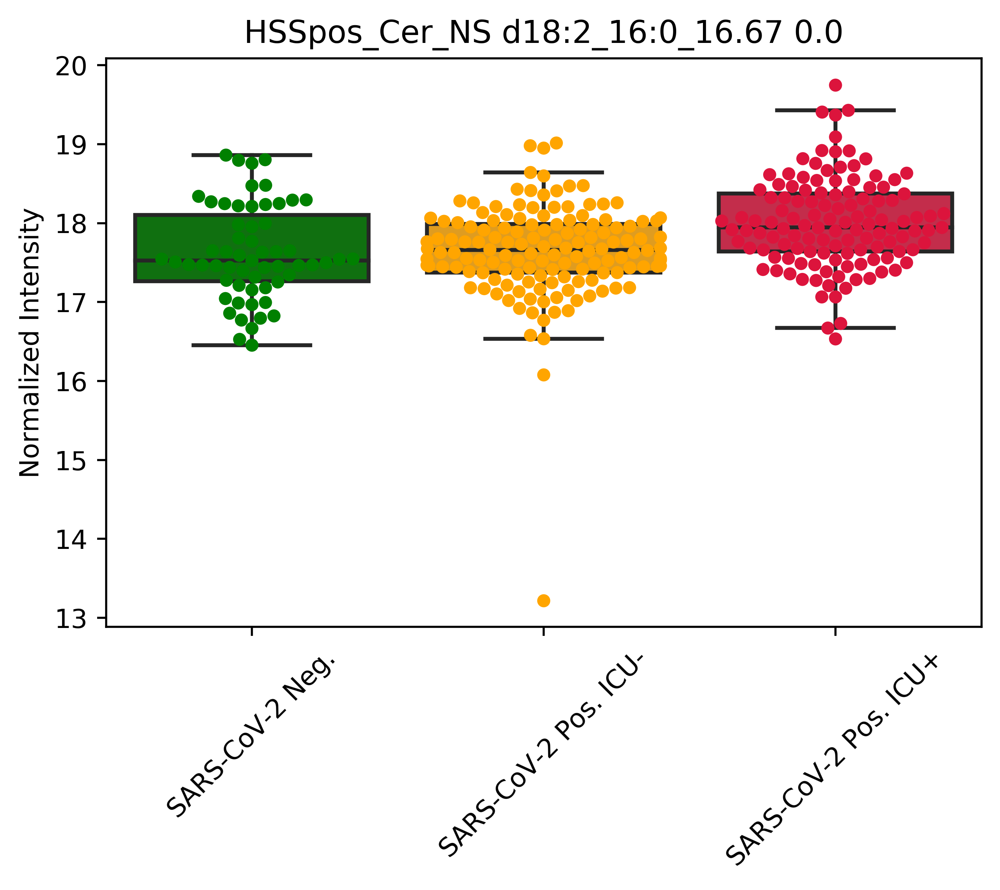

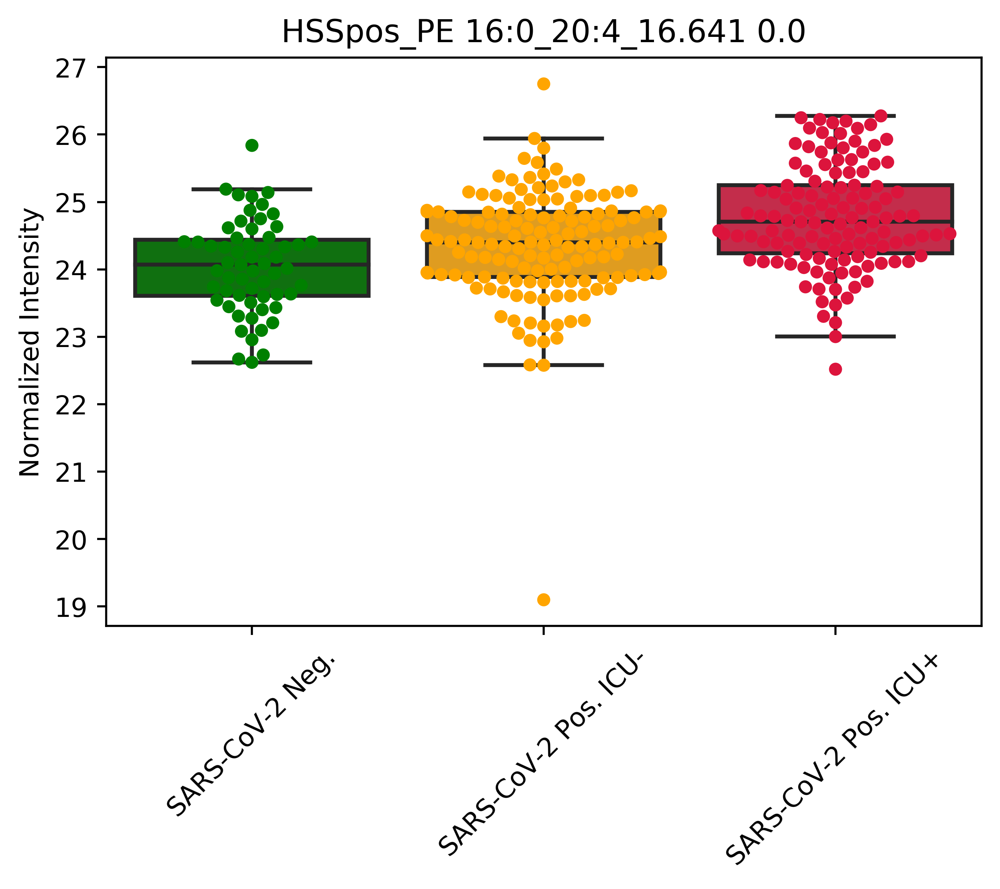

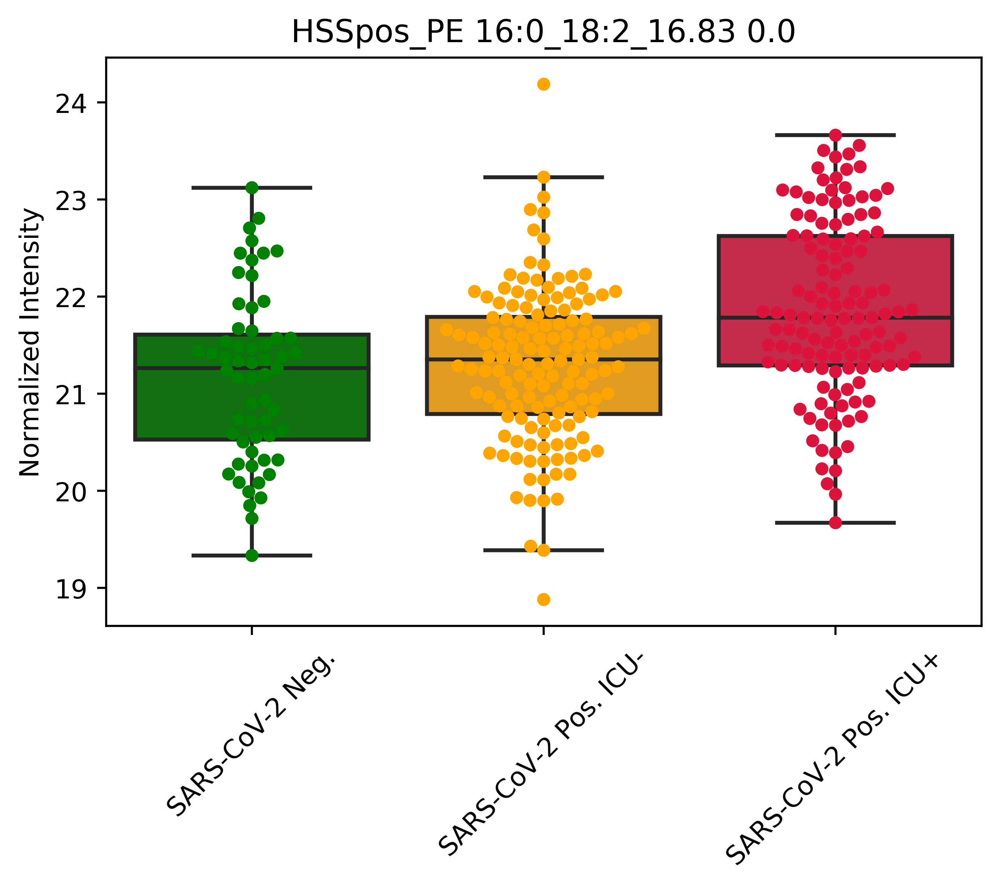

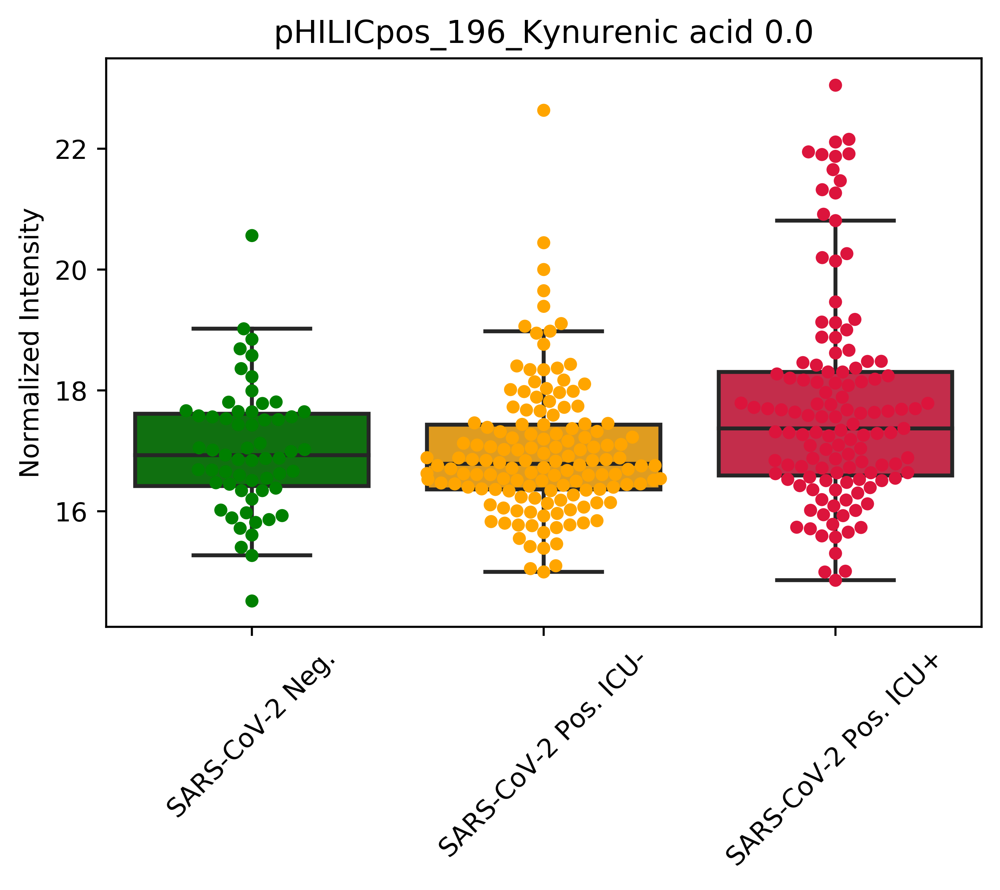

In [22]:
plots = []
pvals = []
names = []

for met,i in zip(goodMets,range(len(goodMets))):
    fig,ax = plt.subplots()
    norm = 1#np.median(X[:,met])
    tempX = np.concatenate((X_tot[:,i],X_val[:,order[met]]))
    tempy = np.concatenate((y_tot,[-1 for x in X_val]))
    tempDict = {}
    
    for x,yy,i in zip(tempX,tempy,range(len(tempX))):
        tempDict[i] = {"ICU":yy,"Normalized Intensity":x}
    tempDf = pd.DataFrame.from_dict(tempDict,orient="index")
    sb.swarmplot(data=tempDf,x="ICU",y="Normalized Intensity",palette={-1:"green",
                                                                                 0:"orange",
                                                                                 1:"crimson"})
    sb.boxplot(data=tempDf,x="ICU",y="Normalized Intensity",fliersize=0,palette={-1:"green",
                                                                                 0:"orange",
                                                                                 1:"crimson"})
    
    
    f,p = stats.f_oneway(*[tempDf[tempDf["ICU"] == x]["Normalized Intensity"] for x in [-1,0,1]])
    pvals.append(p)
    names.append(mol_names_sorted[met])
    
    plt.title(mol_names_sorted[met])
    
    plt.xticks([0,1,2],["SARS-CoV-2 Neg.","SARS-CoV-2 Pos. ICU-","SARS-CoV-2 Pos. ICU+"],rotation=45)
    plt.xlabel("")
    
    
    plots.append(ax)
    
alpha = 0.05
reject,pvals_corr,_,_ = multipletests(pvals,alpha,method="fdr_bh")

for p,plot,name in zip(pvals_corr,plots,names):
    print(name,p)
    plot.set_title(name + " " + str(np.round(p,3)))

    

In [23]:
plots = []
pvals = []
names = []
ind = 0

tempDict = {}

mapper = {-1:"SARS-CoV-2 Neg.",0:"SARS-CoV-2 Pos. ICU-",1:"SARS-CoV-2 Pos. ICU+"}
for met,i in zip(goodMets,range(len(goodMets))):
    norm = np.mean(X_val[:,order[met]])
    tempX = np.concatenate((X_tot[:,i],X_val[:,order[met]])) - norm
    tempy = np.concatenate((y_tot,[-1 for x in X_val]))
    
    for x,yy in zip(tempX,tempy):
        tempDict[ind] = {"ICU":mapper[yy],"Normalized Intensity":x,"Metabolite":mol_names_sorted[met]}
        ind += 1
    
    
tempDf = pd.DataFrame.from_dict(tempDict,orient="index")



    

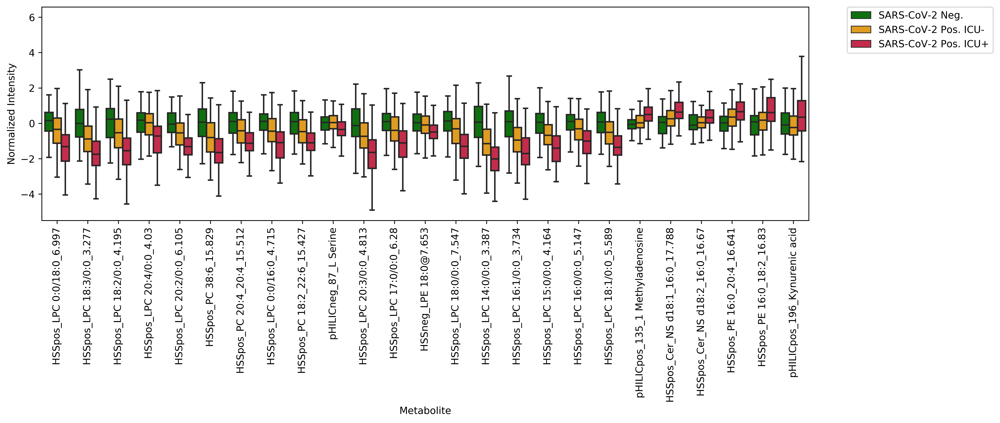

In [24]:
fig,ax = plt.subplots(figsize=(14,4))

# sb.swarmplot(data=tempDf,x="Metabolite",y="Normalized Intensity",hue="ICU",dodge=True,palette={mapper[-1]:"green",
#                                                                                  mapper[0]:"orange",
#                                                                                  mapper[1]:"crimson"},size=1.5)
sb.boxplot(data=tempDf,x="Metabolite",y="Normalized Intensity",hue="ICU",fliersize=0,palette={mapper[-1]:"green",
                                                                                 mapper[0]:"orange",
                                                                                 mapper[1]:"crimson"},
           hue_order=["SARS-CoV-2 Neg.","SARS-CoV-2 Pos. ICU-","SARS-CoV-2 Pos. ICU+"])
plt.xticks(rotation=90)

handles, labels = ax.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)